# Reducing Misclassification Errors in Signal Transmission Systems: 
## A Study of Telecommunication Equipment Manufacturers Using Mixture Models

> This research uses Gaussian Mixture Models to create and test a probabilistic framework to reduce incorrect classifications in telecommunications network signal transmission systems. By solving signal classification problems, this study aims to improve data integrity, network reliability, and communication performance in noisy and interfering environments like Nigerian telecommunication systems. 

In [1]:
# Importing the required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix          
from scipy.stats import norm

# Data Preprocessing and Exploratory Data Analysis

1. **Loading  the Dataset**
2. **Feature Engineering**
3. **Normalizing the Data**   
4. **Handling Missing Data**            

In [2]:
# Load the dataset
df = pd.read_excel("C:/Users/USER/Desktop/TELCO DATA 25000.xlsx")

# Display the first few rows of the DataFrame
print(df.head())


            Timestamp  Signal_Strength_dB  Frequency_Hz  Noise_Level_dB  \
0 2024-01-01 00:00:00               88.67       1087.71            2.76   
1 2024-01-01 01:00:00               60.67       1152.38            7.33   
2 2024-01-01 02:00:00               64.45        935.15            2.14   
3 2024-01-01 03:00:00               86.96       1008.05            7.03   
4 2024-01-01 04:00:00               91.84        879.27            7.52   

   Equipment_Type  Bandwidth_Capacity_Mbps  External_Noise_dB  Temperature_C  \
0  Manufacturer A                    32.15              18.89          22.36   
1  Manufacturer E                    95.16               7.36          31.69   
2  Manufacturer A                    84.85              16.55          21.53   
3  Manufacturer D                    98.55              15.50          26.98   
4  Manufacturer C                    49.27              16.63          34.91   

     Load  Signal_to_Noise_Ratio  ... Distribution_Type Signal_Type 

In [4]:
df.shape

(25726, 21)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25726 entries, 0 to 25725
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Timestamp                      25726 non-null  datetime64[ns]
 1   Signal_Strength_dB             25726 non-null  float64       
 2   Frequency_Hz                   25726 non-null  float64       
 3   Noise_Level_dB                 25726 non-null  float64       
 4   Equipment_Type                 25726 non-null  object        
 5   Bandwidth_Capacity_Mbps        25726 non-null  float64       
 6   External_Noise_dB              25726 non-null  float64       
 7   Temperature_C                  25726 non-null  float64       
 8   Load                           25726 non-null  object        
 9   Signal_to_Noise_Ratio          25726 non-null  float64       
 10  Classification_Outcome         25726 non-null  object        
 11  Distribution_Ty

In [5]:
df.describe()

,Timestamp,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Latitude,Longitude,Distance_From_Base_Station_km,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
count,25726,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000,25726.000000
mean,2025-06-19 22:30:00,74.920067,1000.011770,5.491261,54.976705,10.515596,30.002700,5.484241,8.993409,8.472920,10.029586,75.032932,5.502307,5.484241
min,2024-01-01 00:00:00,50.000000,800.000000,1.000000,10.000000,1.000000,20.000000,1.000000,4.000200,2.000200,0.000000,50.000000,1.000000,1.000000
25%,2024-09-24 23:15:00,62.482500,900.222500,3.240000,32.490000,5.710000,25.000000,3.210000,6.523550,5.211025,5.030000,62.650000,3.242500,3.210000
50%,2025-06-19 22:30:00,74.920000,1000.445000,5.480000,55.190000,10.600000,30.000000,5.490000,8.964400,8.464600,10.090000,75.170000,5.490000,5.490000
75%,2026-03-14 21:45:00,87.500000,1099.380000,7.750000,77.380000,15.280000,35.010000,7.730000,11.487800,11.727475,15.070000,87.367500,7.750000,7.730000
max,2026-12-07 21:00:00,99.990000,1200.000000,10.000000,100.000000,20.000000,40.000000,10.000000,13.999900,14.999400,20.000000,100.000000,10.000000,10.000000
std,NaN,14.430340,115.203181,2.607108,25.888600,5.504230,5.764998,2.599400,2.875230,3.755094,5.787264,14.362934,2.596086,2.599400


In [21]:
# Missing Values
df.isna().sum()

Timestamp                           0
Signal_Strength_dB                  0
Frequency_Hz                        0
Noise_Level_dB                      0
Equipment_Type                      0
Bandwidth_Capacity_Mbps             0
External_Noise_dB                   0
Temperature_C                       0
Load                                0
Signal_to_Noise_Ratio               0
Classification_Outcome              0
Distribution_Type                   0
Signal_Type                         0
Error_Type                       8699
Latitude                            0
Longitude                           0
Distance_From_Base_Station_km       0
Network_Node_Type                   0
Mean_Signal_Strength_dB             0
Signal_Strength_Variance            0
SNR                                 0
dtype: int64

In [4]:
df.Error_Type.isna().sum()

8699

In [ ]:
df['Error_Type'].fillna('Unknown', inplace=True)
df

In [15]:
df.Error_Type.value_counts()

Error_Type
Unknown           8699
False Positive    8530
False Negative    8497
Name: count, dtype: int64

### The dataset contains 25726 rows and 21 columns.
### There are no duplicate records. But, Error_type colum have 8699 missing records and it was repalced with unknown value.

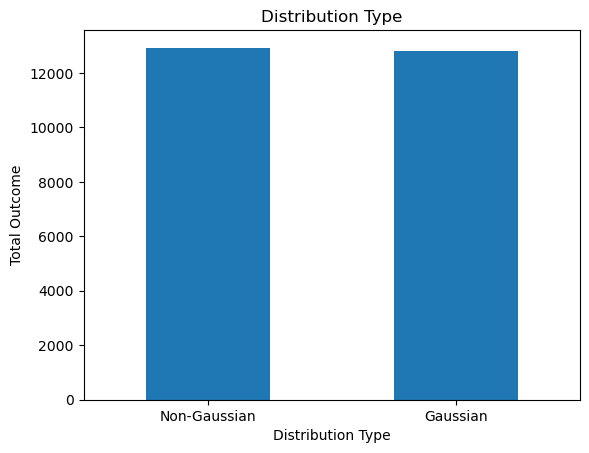

Distribution_Type
Non-Gaussian    12924
Gaussian        12802
Name: count, dtype: int64


In [76]:
df.Distribution_Type.value_counts().plot(kind="bar")
plt.title("Distribution Type")
plt.xlabel("Distribution Type")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df.Distribution_Type.value_counts())

## Non-Gaussian Distribution

In [12]:
df_Non_Guassians= df[df['Distribution_Type'] == 'Non-Gaussian']
df_Non_Guassians                          

,Timestamp,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Equipment_Type,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Load,Signal_to_Noise_Ratio,...,Distribution_Type,Signal_Type,Error_Type,Latitude,Longitude,Distance_From_Base_Station_km,Network_Node_Type,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
1,2024-01-01 01:00:00,60.67,1152.38,7.33,Manufacturer E,95.16,7.36,31.69,Medium,6.39,...,Non-Gaussian,Data,False Positive,6.7874,3.9324,7.39,4G,78.89,3.46,6.39
2,2024-01-01 02:00:00,64.45,935.15,2.14,Manufacturer A,84.85,16.55,21.53,Low,4.90,...,Non-Gaussian,Control,False Positive,9.8501,14.5474,10.09,5G,63.92,4.06,4.90
5,2024-01-01 05:00:00,97.40,1007.10,8.07,Manufacturer C,99.72,11.71,31.47,High,4.38,...,Non-Gaussian,Control,False Positive,9.3279,13.1298,2.59,3G,61.41,8.89,4.38
8,2024-01-01 08:00:00,94.43,1082.16,1.22,Manufacturer A,48.41,12.01,31.41,Medium,3.24,...,Non-Gaussian,Voice,False Positive,8.6617,14.8394,13.20,3G,63.36,7.47,3.24
9,2024-01-01 09:00:00,97.20,1168.48,2.84,Manufacturer E,37.35,3.79,34.01,Low,6.43,...,Non-Gaussian,Voice,False Negative,4.8070,12.2431,4.29,4G,71.34,7.22,6.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25716,2026-12-07 12:00:00,82.87,1069.02,3.38,Manufacturer B,49.33,16.00,39.14,High,8.21,...,Non-Gaussian,Data,NaN,8.1095,9.9938,14.40,5G,94.29,4.04,8.21
25718,2026-12-07 14:00:00,52.67,911.84,8.13,Manufacturer A,40.94,6.16,29.79,High,6.54,...,Non-Gaussian,Voice,False Positive,10.3262,4.2843,9.01,5G,93.85,9.49,6.54
25721,2026-12-07 17:00:00,50.02,989.38,4.54,Manufacturer C,55.96,18.27,31.83,Medium,7.16,...,Non-Gaussian,Control,NaN,10.1541,8.5255,5.16,4G,62.23,4.71,7.16
25723,2026-12-07 19:00:00,94.29,1163.78,9.08,Manufacturer D,99.10,7.48,35.59,Low,8.08,...,Non-Gaussian,Control,False Positive,8.8111,5.6831,15.24,LTE,84.53,6.47,8.08


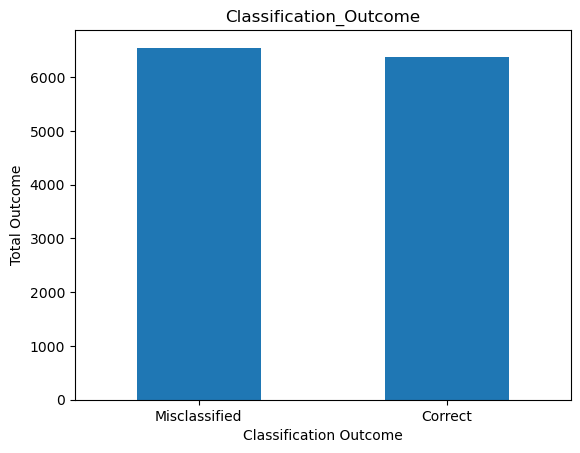

Classification_Outcome
Misclassified    6545
Correct          6379
Name: count, dtype: int64


In [13]:
df_Non_Guassians["Classification_Outcome"].value_counts().plot(kind="bar")
plt.title("Classification_Outcome")
plt.xlabel("Classification Outcome")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df_Non_Guassians.Classification_Outcome.value_counts())

## Gaussian Distribution

In [42]:
df_Gaussian= df[df['Distribution_Type'] == 'Gaussian']
df_Gaussian                         

,Timestamp,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Equipment_Type,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Load,Signal_to_Noise_Ratio,...,Distribution_Type,Signal_Type,Error_Type,Latitude,Longitude,Distance_From_Base_Station_km,Network_Node_Type,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
0,2024-01-01 00:00:00,88.67,1087.71,2.76,Manufacturer A,32.15,18.89,22.36,Medium,6.28,...,Gaussian,Voice,False Negative,10.4507,2.4918,19.29,4G,68.62,9.09,6.28
3,2024-01-01 03:00:00,86.96,1008.05,7.03,Manufacturer D,98.55,15.50,26.98,Medium,8.33,...,Gaussian,Data,False Negative,6.3190,6.8003,13.39,4G,96.37,9.33,8.33
4,2024-01-01 04:00:00,91.84,879.27,7.52,Manufacturer C,49.27,16.63,34.91,High,6.42,...,Gaussian,Control,False Positive,12.5085,2.3745,13.78,3G,64.24,9.18,6.42
6,2024-01-01 06:00:00,56.16,864.99,2.57,Manufacturer E,11.41,3.15,32.99,Medium,9.86,...,Gaussian,Data,NaN,6.3968,8.8707,5.19,5G,63.83,3.69,9.86
7,2024-01-01 07:00:00,75.61,973.02,8.85,Manufacturer D,46.80,14.28,22.02,Low,4.32,...,Gaussian,Voice,False Negative,9.5915,4.9501,0.16,3G,50.16,2.48,4.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25717,2026-12-07 13:00:00,86.72,1059.71,9.50,Manufacturer A,38.21,14.68,37.13,High,3.92,...,Gaussian,Control,NaN,13.7262,13.7251,3.01,5G,92.96,6.50,3.92
25719,2026-12-07 15:00:00,94.41,927.23,4.51,Manufacturer C,62.31,3.30,30.49,High,6.49,...,Gaussian,Voice,NaN,5.6041,11.2848,6.47,3G,66.77,2.99,6.49
25720,2026-12-07 16:00:00,72.56,1040.30,9.01,Manufacturer A,44.73,11.13,30.15,Medium,6.50,...,Gaussian,Data,False Negative,8.7524,2.8964,8.24,3G,90.66,2.40,6.50
25722,2026-12-07 18:00:00,55.32,836.30,8.12,Manufacturer B,82.79,6.63,38.24,Low,5.70,...,Gaussian,Voice,NaN,8.3401,9.5149,9.26,5G,71.72,1.34,5.70


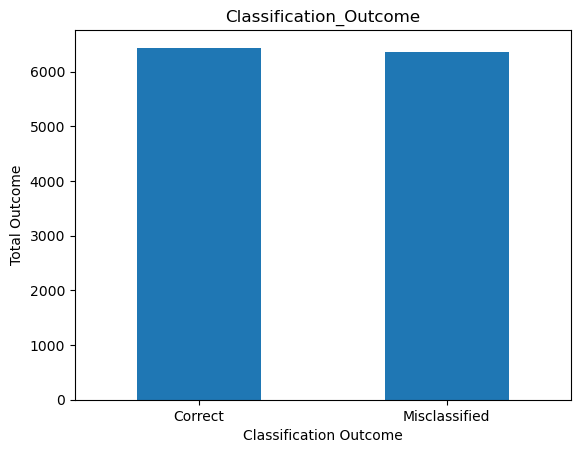

Classification_Outcome
Correct          6437
Misclassified    6365
Name: count, dtype: int64


In [10]:
df_Gaussian["Classification_Outcome"].value_counts().plot(kind="bar")
plt.title("Classification_Outcome")
plt.xlabel("Classification Outcome")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df_Gaussian.Classification_Outcome.value_counts())

## Signal Type

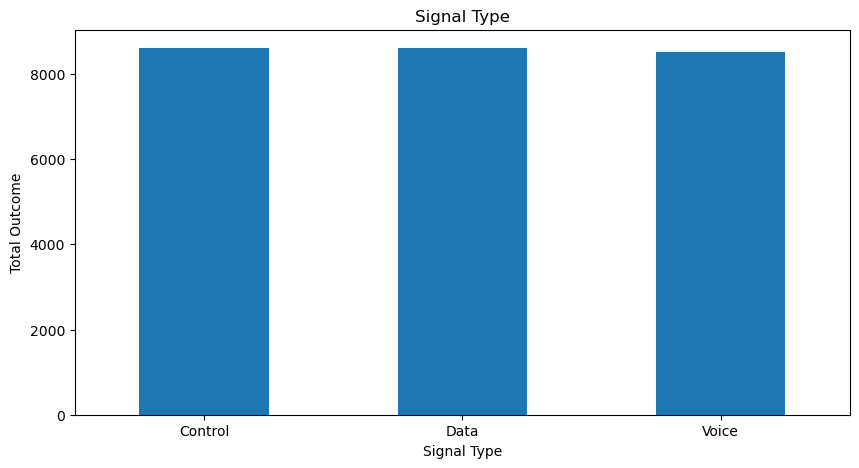

Signal_Type
Control    8607
Data       8601
Voice      8518
Name: count, dtype: int64


In [25]:
df.Signal_Type.value_counts().plot(kind="bar", figsize=(10, 5))
plt.title("Signal Type")
plt.xlabel("Signal Type")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df.Signal_Type.value_counts())

## Equipment Type

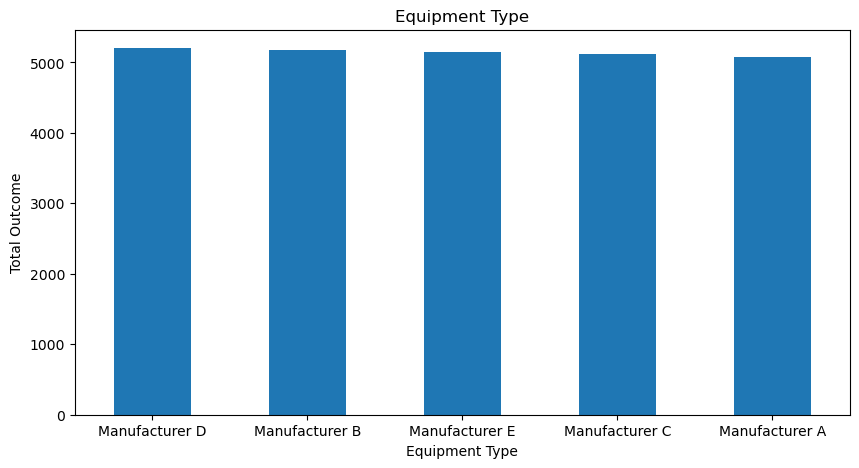

Equipment_Type
Manufacturer D    5204
Manufacturer B    5182
Manufacturer E    5150
Manufacturer C    5119
Manufacturer A    5071
Name: count, dtype: int64


In [32]:
df.Equipment_Type.value_counts().plot(kind="bar", figsize=(10, 5))
plt.title("Equipment Type")
plt.xlabel("Equipment Type")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df.Equipment_Type.value_counts())

### **With the Equipment Type used, Manufacturer D have the highest Outcome follow by Manufacturer B, Manufacturer E, Manufacturer C and Manufacturer A have the lowest Outcome.**

## Classification Outcome

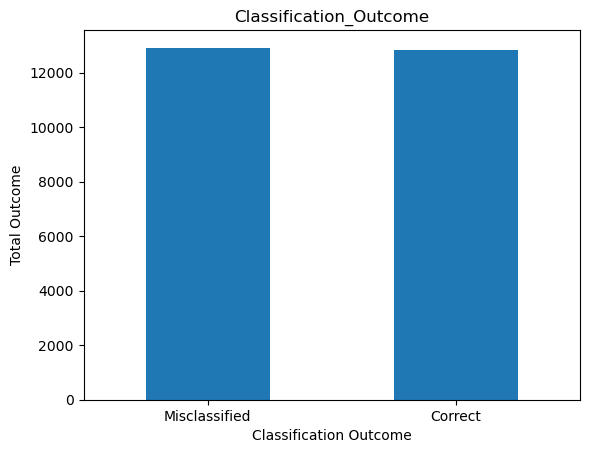

Classification_Outcome
Misclassified    12910
Correct          12816
Name: count, dtype: int64


In [26]:
df["Classification_Outcome"].value_counts().plot(kind="bar")
plt.title("Classification_Outcome")
plt.xlabel("Classification Outcome")
plt.ylabel("Total Outcome")
plt.xticks(rotation=0)
plt.show();
print(df.Classification_Outcome.value_counts())

### **Misclassified label have the highest value compared with Correct label**

### Network Node Type

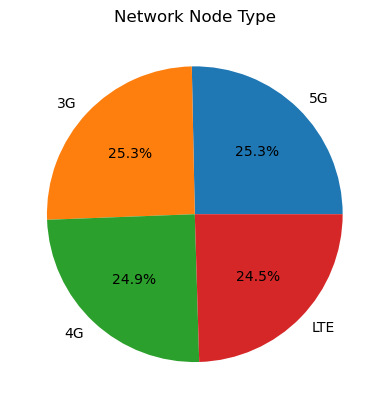

Network_Node_Type
5G     6515
3G     6503
4G     6399
LTE    6309
Name: count, dtype: int64


In [63]:
pp=df.Network_Node_Type.value_counts()
plt.pie(pp,labels=pp.index,autopct='%1.1f%%')
plt.title("Network Node Type")
plt.show()
print(df.Network_Node_Type.value_counts());

## Global Distribution of Signal Classification Outcome

In [3]:
import plotly.express as px

global_data = df.groupby(['Longitude', 'Latitude', 'Classification_Outcome']).size().reset_index(name='Counts')

# Create the scatter_geo plot
fig = px.scatter_geo(
    global_data,
    lat='Latitude',
    lon='Longitude',
    size='Counts', 
    color='Classification_Outcome',  
    hover_name='Classification_Outcome',
    title='Global Distribution of Signal Classification Outcomes',
    projection='natural earth'
)

fig.update_layout(
    geo=dict(
        showland=True, landcolor="lightgrey",
        showcountries=True, countrycolor="white"
    )
)

fig.show()


## The global distribution shows that the dataset was collected in the Nigerian region, focusing on latitude and longitude

## Classification Outcome By Equipment Type 

In [4]:
pd.crosstab(df["Classification_Outcome"], df["Equipment_Type"])

Equipment_Type,Manufacturer A,Manufacturer B,Manufacturer C,Manufacturer D,Manufacturer E
Classification_Outcome,,,,,
Correct,2518,2589,2540,2555,2614
Misclassified,2553,2593,2579,2649,2536


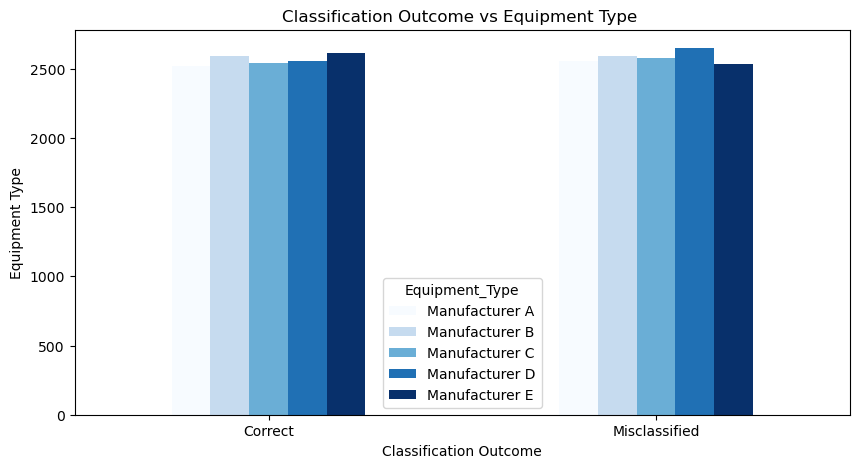

In [3]:
pd.crosstab(df["Classification_Outcome"], df["Equipment_Type"]).plot(kind="bar", cmap='Blues', figsize=(10,5))
plt.title("Classification Outcome vs Equipment Type ")
plt.xlabel("Classification Outcome")
plt.ylabel("Equipment Type")
plt.xticks(rotation=0)
plt.show();

### **Manufacturer D have the highest value of Misclassified label compare with the other manufacturer while Manufacturer E have the highest value of correct label compare with other manufacturer.**

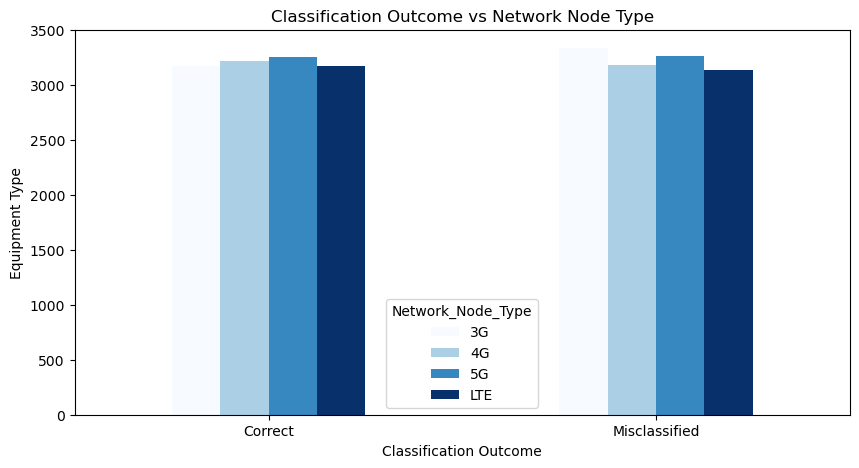

In [24]:
pd.crosstab(df["Classification_Outcome"], df["Network_Node_Type"]).plot(kind="bar", cmap='Blues', figsize=(10,5))
plt.title("Classification Outcome vs Network Node Type")
plt.xlabel("Classification Outcome")
plt.ylabel("Equipment Type")
plt.xticks(rotation=0)
plt.show();

### **5G Newtwork node  have the highest value of correct label compare with other Network node while 3G Network node have the highest value of Misclassified label compare with the other Network node.**                      

# Analysis on Manufacturer E that have the highest value of correct label

In [7]:
df_Manufacturer_E = df[df['Equipment_Type'] == 'Manufacturer E']
df_Manufacturer_E

,Timestamp,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Equipment_Type,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Load,Signal_to_Noise_Ratio,...,Distribution_Type,Signal_Type,Error_Type,Latitude,Longitude,Distance_From_Base_Station_km,Network_Node_Type,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
1,2024-01-01 01:00:00,60.67,1152.38,7.33,Manufacturer E,95.16,7.36,31.69,Medium,6.39,...,Non-Gaussian,Data,False Positive,6.7874,3.9324,7.39,4G,78.89,3.46,6.39
6,2024-01-01 06:00:00,56.16,864.99,2.57,Manufacturer E,11.41,3.15,32.99,Medium,9.86,...,Gaussian,Data,NaN,6.3968,8.8707,5.19,5G,63.83,3.69,9.86
9,2024-01-01 09:00:00,97.20,1168.48,2.84,Manufacturer E,37.35,3.79,34.01,Low,6.43,...,Non-Gaussian,Voice,False Negative,4.8070,12.2431,4.29,4G,71.34,7.22,6.43
10,2024-01-01 10:00:00,66.73,884.21,9.24,Manufacturer E,92.89,6.27,27.19,Medium,2.06,...,Gaussian,Voice,False Negative,4.2057,2.1990,8.13,LTE,93.76,5.54,2.06
13,2024-01-01 13:00:00,68.09,995.50,9.93,Manufacturer E,34.38,4.91,22.81,Medium,4.10,...,Gaussian,Data,False Negative,13.7188,13.8148,16.93,LTE,89.55,7.99,4.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25688,2026-12-06 08:00:00,54.59,957.38,2.26,Manufacturer E,18.78,10.18,27.53,Low,1.96,...,Gaussian,Voice,False Positive,4.4881,5.7467,14.65,5G,61.14,4.82,1.96
25709,2026-12-07 05:00:00,51.94,953.48,3.09,Manufacturer E,89.35,4.92,37.92,Medium,5.88,...,Non-Gaussian,Voice,NaN,9.6187,6.7966,2.72,LTE,99.72,6.84,5.88
25710,2026-12-07 06:00:00,99.02,973.88,4.88,Manufacturer E,17.00,11.69,24.73,Low,4.60,...,Non-Gaussian,Voice,False Negative,10.1049,2.4056,5.37,LTE,92.89,4.86,4.60
25714,2026-12-07 10:00:00,82.46,1010.86,2.17,Manufacturer E,57.71,8.50,35.05,Medium,6.30,...,Gaussian,Control,False Negative,7.6583,9.9716,10.54,5G,58.69,4.15,6.30


## Manufacturer E by Network Node

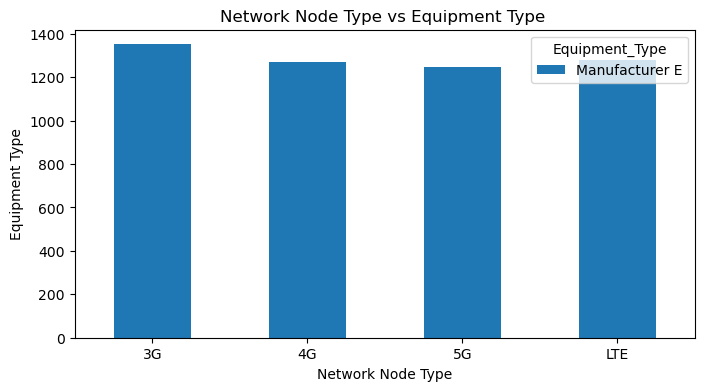

Equipment_Type     Manufacturer E
Network_Node_Type                
3G                           1351
4G                           1272
5G                           1246
LTE                          1281


In [9]:
pd.crosstab(df_Manufacturer_E["Network_Node_Type"], df_Manufacturer_E['Equipment_Type']).plot(kind="bar", figsize=(8,4))
plt.title("Network Node Type vs Equipment Type ")
plt.xlabel("Network Node Type")
plt.ylabel("Equipment Type")
plt.xticks(rotation=0)
plt.show();
crosstab_result= pd.crosstab(df["Network_Node_Type"], df[df['Equipment_Type'] == 'Manufacturer E']['Equipment_Type'])
print(crosstab_result)


### Manufacturer E product more of 3G Network Node Type

## Manufacturer E, Network Node and Classification Outcome

In [29]:
pd.crosstab(df_Manufacturer_E["Network_Node_Type"], df_Manufacturer_E['Classification_Outcome'])

Classification_Outcome,Correct,Misclassified
Network_Node_Type,,
3G,661,690
4G,633,639
5G,638,608
LTE,682,599


### **Manufacturer E product more of 3G Network Node with highest  Misclassified Label while LTG Network Node product by Maunfacturer E have the highest Correct label**

### Observations:
1. **3G**:
   - Correctly classified: 661
   - Misclassified: 690
   - Misclassification is slightly higher than correct classification for 3G nodes, indicating the model struggles with these classifications.

2. **4G**:
   - Correctly classified: 633
   - Misclassified: 639
   - Similar to 3G, the number of misclassifications is almost equal to the correct classifications, showing potential challenges in classification accuracy for 4G nodes.

3. **5G**:
   - Correctly classified: 638
   - Misclassified: 608
   - The correct classifications are slightly higher than misclassifications, indicating better performance compared to 3G and 4G but still far from ideal.

4. **LTE**:
   - Correctly classified: 682
   - Misclassified: 599
   - LTE has the highest number of correct classifications among the network types and fewer misclassifications, suggesting relatively better performance.

### Key Insights:
- Across all network types, the **classification accuracy** is suboptimal, as misclassified instances are almost as frequent as correct ones.
- **LTE** performs best, with the highest correct classifications and the least misclassifications relative to the others.
- The model might need improvement in feature selection, training data quality, or algorithm tuning to enhance classification performance.

## Calculation of Accuracy each network node type

  Network_Node_Type  Correct  Misclassified  Accuracy (%)
0                3G      661            690     48.926721
1                4G      633            639     49.764151
2                5G      638            608     51.203852
3               LTE      682            599     53.239657


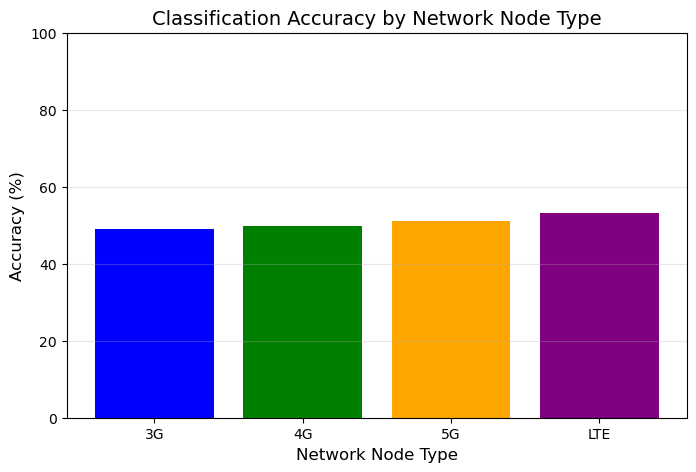

In [17]:
# Data provided
data = {
    "Network_Node_Type": ["3G", "4G", "5G", "LTE"],
    "Correct": [661, 633, 638, 682],
    "Misclassified": [690, 639, 608, 599]
}

# DataFrame
df_Accuracy = pd.DataFrame(data)

# Calculating for the Accuracy for each network node type
df_Accuracy['Accuracy (%)'] = (df_Accuracy['Correct'] / (df_Accuracy['Correct'] + df_Accuracy['Misclassified'])) * 100
print(df_Accuracy)

# Plotting the accuracy
plt.figure(figsize=(8, 5))
plt.bar(df["Network_Node_Type"], df["Accuracy (%)"], color=["blue", "green", "orange", "purple"])
plt.title("Classification Accuracy by Network Node Type", fontsize=14)
plt.xlabel("Network Node Type", fontsize=12)
plt.ylabel("Accuracy (%)", fontsize=12)
plt.ylim(0, 100)
plt.grid(axis='y', alpha=0.3)
plt.show()


### Accuracy Result:
- **3G**: **48.93%**
  - The model struggles with 3G classification, with slightly fewer correct classifications than misclassifications.
  - This suggests the model may need further optimization for 3G network nodes.

- **4G**: **49.76%**
  - Performance for 4G is slightly better than 3G, but still below 50%.
  - Indicates potential challenges in distinguishing 4G nodes effectively.

- **5G**: **51.20%**
  - Accuracy surpasses 50%, showing some improvement in classification for 5G.
  - However, there is still room for significant enhancement.

- **LTE**: **53.24%**
  - LTE has the highest accuracy, with the majority of instances correctly classified.
  - While better than other network types, this result is still suboptimal.

### Key Insights:
1. **Overall Accuracy is Low**:
   - All accuracy values are close to 50%, indicating the model's performance is marginally better than random guessing.
2. **Best Performing Node Type**: LTE (53.24% accuracy).
3. **Poor Performing Node Types**: 3G (48.93%) and 4G (49.76%).

#### The mathematical representation is in the word file.

## 3G Network Node Type product by Maunfacturer E

In [27]:
df_3G_Network = df_Manufacturer_E_drop[df_Manufacturer_E_drop['Network_Node_Type'] == '3G']
df_3G_Network

,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Equipment_Type,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Classification_Outcome,Distance_From_Base_Station_km,Network_Node_Type,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
19,53.85,1025.53,5.81,Manufacturer E,85.23,16.09,28.50,1.82,Misclassified,13.17,3G,50.80,3.37,1.82
26,54.31,860.67,6.42,Manufacturer E,68.23,14.38,22.50,6.71,Misclassified,1.46,3G,69.64,6.70,6.71
59,87.10,895.60,9.64,Manufacturer E,72.91,17.24,34.50,8.56,Correct,11.73,3G,81.54,3.43,8.56
64,83.11,905.85,6.98,Manufacturer E,20.74,1.33,35.51,3.71,Correct,19.51,3G,51.73,4.90,3.71
66,79.21,892.14,6.87,Manufacturer E,57.63,6.16,25.40,8.55,Misclassified,8.93,3G,98.45,6.17,8.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25609,95.16,884.06,8.34,Manufacturer E,68.60,12.86,21.64,4.59,Correct,19.36,3G,95.60,2.61,4.59
25615,91.80,1062.96,3.02,Manufacturer E,11.09,5.86,27.95,6.41,Correct,8.87,3G,72.02,1.92,6.41
25626,63.58,979.57,1.63,Manufacturer E,34.20,8.02,39.53,3.45,Misclassified,11.00,3G,58.93,5.08,3.45
25668,99.77,1153.63,5.22,Manufacturer E,55.65,10.65,35.49,1.93,Correct,14.19,3G,66.61,8.83,1.93


# Mean Signal Strength and Distance from Base Station

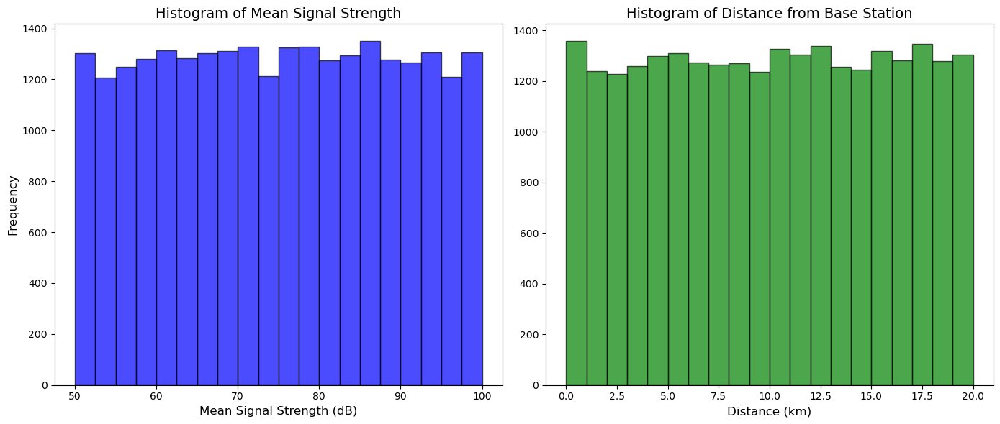

In [23]:
# Subplots for two histograms
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)

# Histogram for Mean Signal Strength
axes[0].hist(df['Mean_Signal_Strength_dB'], bins=20, color='blue', alpha=0.7, edgecolor='black')
axes[0].set_title('Histogram of Mean Signal Strength', fontsize=14)
axes[0].set_xlabel('Mean Signal Strength (dB)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# Histogram for Distance from Base Station
axes[1].hist(df['Distance_From_Base_Station_km'], bins=20, color='green', alpha=0.7, edgecolor='black')
axes[1].set_title('Histogram of Distance from Base Station', fontsize=14)
axes[1].set_xlabel('Distance (km)', fontsize=12)

# Improve layout and show plot
plt.tight_layout()
plt.show()

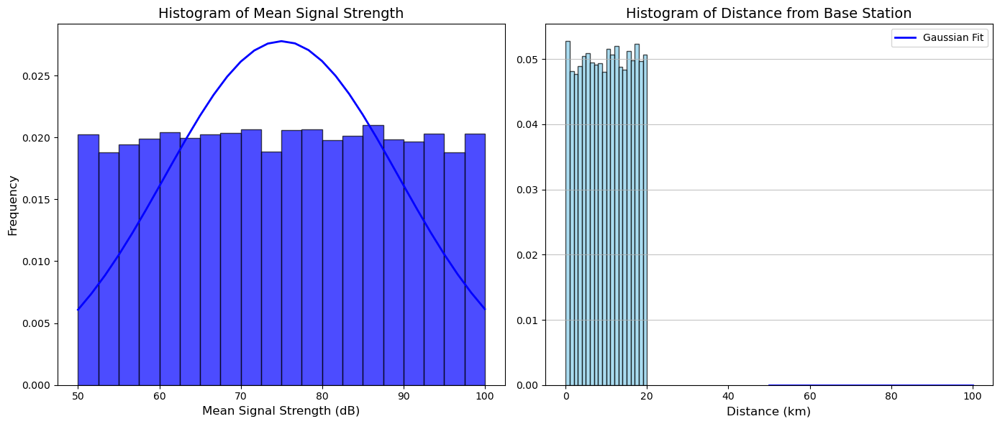

In [31]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)
data1 = df['Mean_Signal_Strength_dB']
data2 = df['Distance_From_Base_Station_km']

# Histogram for Mean Signal Strength
axes[0].hist(data1, bins=20, color='blue', alpha=0.7, edgecolor='black', dnesity=True)
mean, std_dev = norm.fit(data1)
pdf = norm.pdf(bins, mean, std_dev)
axes[0].plot(bins, pdf, color='blue', linewidth=2, label='Gaussian Fit')
axes[0].set_title('Histogram of Mean Signal Strength', fontsize=14)
axes[0].set_xlabel('Mean Signal Strength (dB)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# Histogram for Distance from Base Station
axes[1].hist(data2, bins=20, color='skyblue', alpha=0.7, edgecolor='black', density=True)
mean, std_dev = norm.fit(data2)
pdf = norm.pdf(bins, mean, std_dev)
axes[1].plot(bins, pdf, color='blue', linewidth=2, label='Gaussian Fit')
axes[1].set_title('Histogram of Distance from Base Station', fontsize=14)
axes[1].set_xlabel('Distance (km)', fontsize=12)

plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

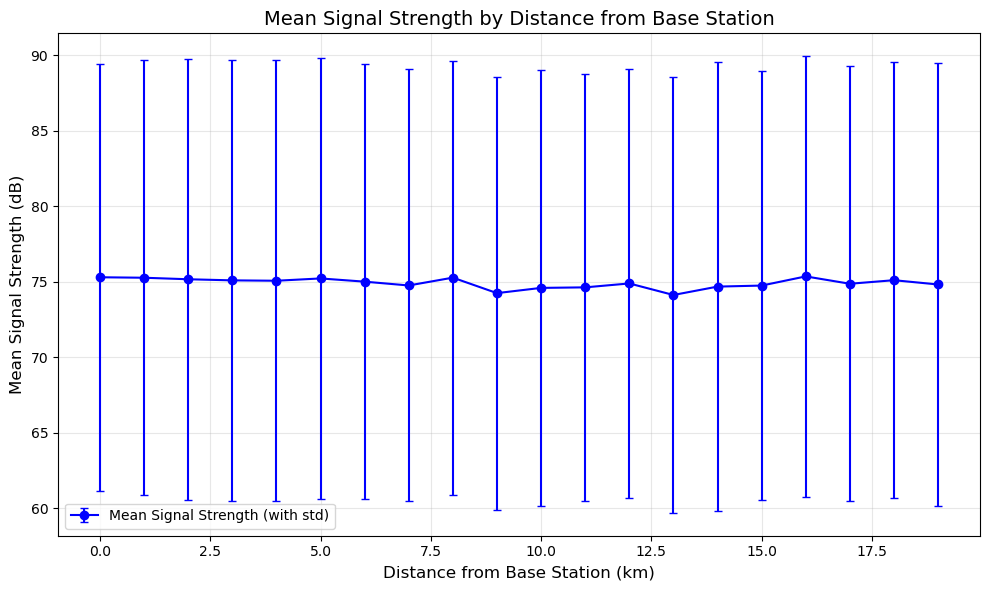

In [22]:
# Bin the data by distance for aggregation
bins = np.linspace(0, 20, 21)  # 20 bins from 0 to 20 km
df['Distance_Binned'] = pd.cut(df['Distance_From_Base_Station_km'], bins=bins, labels=bins[:-1])

# Calculate mean and standard deviation of signal strength in each bin
aggregated_data = df.groupby('Distance_Binned')['Signal_Strength_dB'].agg(['mean', 'std']).reset_index()
aggregated_data['Distance_Binned'] = aggregated_data['Distance_Binned'].astype(float)

# Plot the aggregated data with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(
    aggregated_data['Distance_Binned'],
    aggregated_data['mean'],
    yerr=aggregated_data['std'],
    fmt='o-',
    label='Mean Signal Strength (with std)',
    capsize=3,
    color='blue',
)

plt.title('Mean Signal Strength by Distance from Base Station', fontsize=14)
plt.xlabel('Distance from Base Station (km)', fontsize=12)
plt.ylabel('Mean Signal Strength (dB)', fontsize=12)
plt.grid(alpha=0.3)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()


#### The **scatter plot with error bars**, displaying the relationship between **Mean Signal Strength (dB)** and the **Distance from Base Station (km)**. Here’s an interpretation of the chart:

### Key Observations:
1. **Mean Signal Strength**:
   - The plot shows the mean signal strength values are relatively constant across the different distances from the base station, fluctuating around **75 dB**.
   - There is no noticeable trend that suggests signal strength significantly increases or decreases as the distance from the base station changes. This may suggest either a controlled environment or a signal setup where distance has less impact on the measured signal strength.

2. **Error Bars (Standard Deviation)**:
   - The **blue vertical lines** represent **error bars** that extend above and below each data point. These error bars indicate the **standard deviation (std)** of the signal strength measurements at each distance from the base station.
   - The length of the error bars shows how much the signal strength values vary around the mean at each distance point. A longer error bar means more variability, while a shorter error bar indicates more consistency in the measurements at that distance.

3. **Distance from Base Station**:
   - The **x-axis** represents the distance from the base station, ranging from **0 to 20 km**.
   - The distances are evenly spaced, and the signal strength appears fairly stable across these distances.

4. **Interpretation of Variability**:
   - The **standard deviation** seems to remain somewhat consistent across the distances, with the error bars being of roughly equal length at different distance points.
   - This suggests that the variability in signal strength doesn't strongly correlate with distance in this dataset, which may imply a stable signal environment, possibly due to consistent factors like terrain or signal management.

### Summary:
- **Signal Strength** is fairly consistent at around **75 dB**, with only moderate fluctuations.
- **Standard Deviation** at each distance shows similar variability, indicating no significant increase or decrease in the spread of signal strength values as the distance increases from the base station.
- This chart could be useful in understanding how stable or unreliable the signal is across different distances from the base station.

### Conclusion:
The **mean signal strength** around **75 dB** with **consistent variability** across distances from the base station (0-20 km). The **error bars** represent the **standard deviation** of the signal strength, which remains fairly constant at all distances, indicating that signal strength does not significantly vary with distance. This suggests a stable signal environment with little fluctuation in signal quality across the observed range.

## Trends of **Mean Signal Strength (dB)**  and **External Noise (SNR)**  Over time.

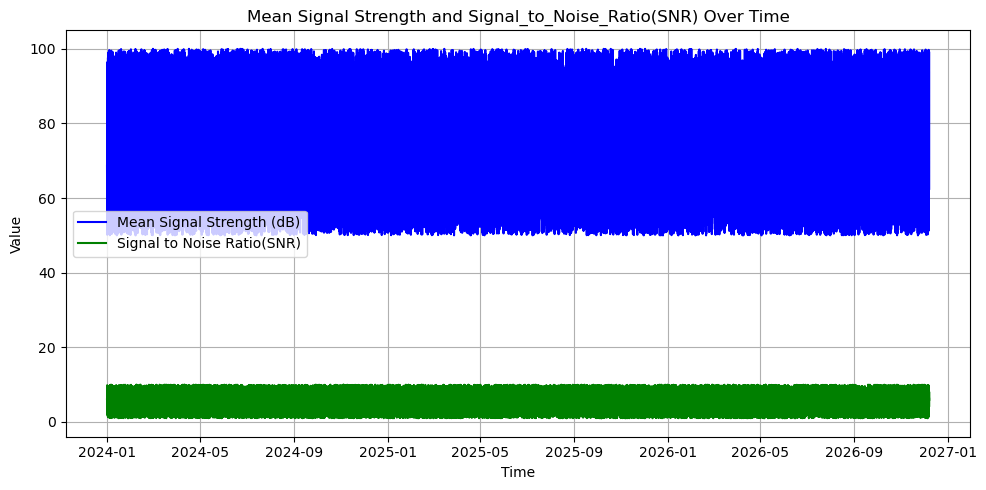

In [24]:
# Convert 'Timestamp' column to datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp']) 
df = df.sort_values('Timestamp')

# Plot Signal Strength and Signal-to-Noise Ratio over Time
plt.figure(figsize=(10, 5))
plt.plot(df['Timestamp'], df['Mean_Signal_Strength_dB'], label='Mean Signal Strength (dB)', color='blue')
plt.plot(df['Timestamp'], df['Signal_to_Noise_Ratio'], label='Signal to Noise Ratio(SNR)', color='green')
plt.title('Mean Signal Strength and Signal_to_Noise_Ratio(SNR) Over Time')
plt.xlabel('Time')
plt.ylabel('Value')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


### Observations:
1. **Signal Strength (Blue):**
   - The signal strength remains consistently high throughout the time period, hovering around the range of **80–100 dB**.
   - The small variations indicate minor fluctuations, which could be attributed to environmental factors or interference. However, these fluctuations do not appear to significantly impact the overall strength of the signal.

2. **Signal-to-Noise Ratio (Green):**
   - The SNR is relatively low compared to the Original signal strength, staying below **20 dB** throughout the time period. This show that noise is one of the primary factors that is affect the signal strength.
   - The stable trend with minimal fluctuations indicates that noise levels are relatively constant and likely well-characterized in the dataset.

3. **Time Span:**
   - The data spans over three years (from early 2022 to the end of 2024), capturing long-term trends in the telecommunications network's signal performance.

### Implications for the Dataset:
1. **High Signal Strength and Low SNR:**
   - Despite high signal strength, the low SNR suggests that noise or interference might be persistent. This could potentially degrade communication quality, making accurate classification crucial.

2. **Dataset Consistency:**
   - The stable trends in both signal strength and SNR indicate a well-controlled and consistent dataset, making it suitable for training probabilistic models like Gaussian Mixture Models.

3. **Use for Modeling:**
   - The consistent signal strength and relatively stable noise environment suggest that key features like `Signal Strength` and `SNR` can be used to build robust classification models. 
   - GMMs can exploit this consistency to separate signal classes effectively by capturing the probabilistic distributions of these features.

### Conclusion:
1. The graph highlights the reliability of the dataset for telecommunications signal analysis, with stable trends in key metrics over a multi-year period.T
2. The low SNR emphasizes the need for advanced models to mitigate the impact of noise, improve classification accuracy, and ensure better network reliability.

# Correlation Analysis

Correlation between Signal_Strength_dB and Signal_to_Noise_Ratio:
                       Signal_Strength_dB  Signal_to_Noise_Ratio
Signal_Strength_dB               1.000000              -0.008289
Signal_to_Noise_Ratio           -0.008289               1.000000


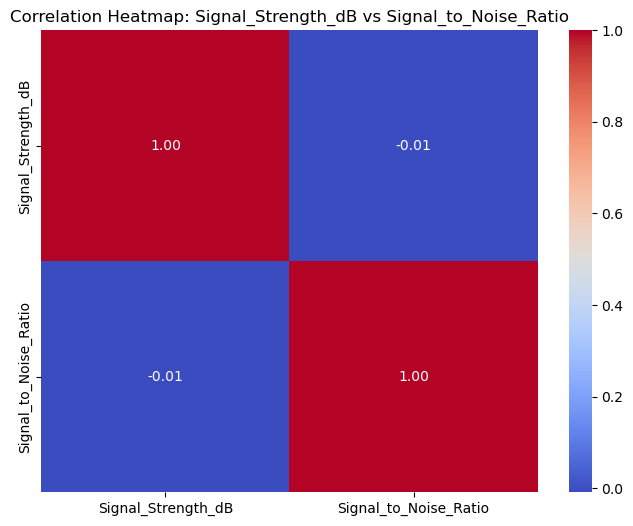

In [26]:
correlation = df[['Signal_Strength_dB', 'Signal_to_Noise_Ratio']].corr()
print("Correlation between Signal_Strength_dB and Signal_to_Noise_Ratio:")
print(correlation)

# Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap: Signal_Strength_dB vs Signal_to_Noise_Ratio')
plt.show()


### The heatmap shows the correlation between Signal_Strength_dB and Signal_to_Noise_Ratio (SNR) in a telecommunications network. 

> ### **Key observations and their implications for solving signal classification problems are as follows:**

### Observations:
1. **Diagonal Correlation:**
   - The diagonal values are 1.0, representing a perfect correlation of each feature with itself, which is expected.

2. **Weak Correlation Between Features:**
   - The off-diagonal value is -0.01, indicating a negligible and slightly negative correlation between **Signal_Strength_dB** and **Signal_to_Noise_Ratio**. This suggests that variations in signal strength do not directly or linearly relate to SNR.

### Implications for Signal Classification:
1. **Feature Independence:**
   - The weak correlation implies that **Signal_Strength_dB** and **Signal_to_Noise_Ratio** are largely independent. Classification models like Gaussian Mixture Models (GMMs) can leverage this independence to better capture the multi-dimensional distribution of the data.

2. **Reducing Misclassifications:**
   - Since the features are not strongly correlated, their individual contributions to classification errors are distinct. Probabilistic approaches like GMMs can reduce these errors by modeling each feature's unique variability and interactions with other features.

3. **Handling Noise and Interference:**
   - In noisy and interfering environments like Nigerian telecommunication systems, the independence of **Signal_Strength_dB** and **SNR** highlights the need for models that can process multi-dimensional, low-correlation data to maintain data integrity and improve network reliability.

### Conclusion:
The heatmap shows a negligible correlation (-0.01) between **Signal_Strength_dB** and **Signal_to_Noise_Ratio**, indicating feature independence. This supports using Gaussian Mixture Models (GMMs) to handle low-correlation, multi-dimensional data, reducing misclassifications and improving data integrity, network reliability, and communication performance in noisy telecommunications environments like Nigeria.

#### The mathematical representation is in the word file.

## **Feature Engineering**:
Based on the dataset structure, here’s a recommendation for feature and target columns:

### Features:
The columns relevant to signal characteristics and transmission context are use as feature.
- `Signal_Strength_dB`
- `Frequency_Hz`
- `Noise_Level_dB`
- `Bandwidth_Capacity_Mbps`
- `External_Noise_dB`
- `Signal_to_Noise_Ratio`
- `Distance_From_Base_Station_km`
- `Mean_Signal_Strength_dB`
- `Signal_Strength_Variance`

### Target:
The column `Classification_Outcome` seems to indicate the class or label for the signals is suitable as the target for classification.


### Feature Columns and Target Column

In [49]:
df_drop = df.drop(["Timestamp", "Equipment_Type", "Load", "Signal_Type", "Distribution_Type", "Error_Type", "Latitude", "Longitude", "Network_Node_Type"], axis=1)
df_drop

,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Classification_Outcome,Distance_From_Base_Station_km,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
0,88.67,1087.71,2.76,32.15,18.89,22.36,6.28,0,19.29,68.62,9.09,6.28
1,60.67,1152.38,7.33,95.16,7.36,31.69,6.39,0,7.39,78.89,3.46,6.39
2,64.45,935.15,2.14,84.85,16.55,21.53,4.90,1,10.09,63.92,4.06,4.90
3,86.96,1008.05,7.03,98.55,15.50,26.98,8.33,1,13.39,96.37,9.33,8.33
4,91.84,879.27,7.52,49.27,16.63,34.91,6.42,1,13.78,64.24,9.18,6.42
...,...,...,...,...,...,...,...,...,...,...,...,...
25721,50.02,989.38,4.54,55.96,18.27,31.83,7.16,0,5.16,62.23,4.71,7.16
25722,55.32,836.30,8.12,82.79,6.63,38.24,5.70,1,9.26,71.72,1.34,5.70
25723,94.29,1163.78,9.08,99.10,7.48,35.59,8.08,0,15.24,84.53,6.47,8.08
25724,67.78,878.66,4.40,27.26,2.00,22.56,5.03,1,0.46,74.37,2.60,5.03


In [70]:
# Convert target column to numeric
label_encoder = LabelEncoder()
df_drop['Classification_Outcome'] = label_encoder.fit_transform(df_drop['Classification_Outcome'])
df_drop['Target'] = df_drop['Classification_Outcome']
df_drop

,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Classification_Outcome,Distance_From_Base_Station_km,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR,Cluster,Target
0,88.67,1087.71,2.76,32.15,18.89,22.36,6.28,0,19.29,68.62,9.09,6.28,0,0
1,60.67,1152.38,7.33,95.16,7.36,31.69,6.39,0,7.39,78.89,3.46,6.39,0,0
2,64.45,935.15,2.14,84.85,16.55,21.53,4.90,1,10.09,63.92,4.06,4.90,3,1
3,86.96,1008.05,7.03,98.55,15.50,26.98,8.33,1,13.39,96.37,9.33,8.33,1,1
4,91.84,879.27,7.52,49.27,16.63,34.91,6.42,1,13.78,64.24,9.18,6.42,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25721,50.02,989.38,4.54,55.96,18.27,31.83,7.16,0,5.16,62.23,4.71,7.16,0,0
25722,55.32,836.30,8.12,82.79,6.63,38.24,5.70,1,9.26,71.72,1.34,5.70,1,1
25723,94.29,1163.78,9.08,99.10,7.48,35.59,8.08,0,15.24,84.53,6.47,8.08,0,0
25724,67.78,878.66,4.40,27.26,2.00,22.56,5.03,1,0.46,74.37,2.60,5.03,3,1


In [28]:
# correlation Matrix
df_drop.corr()

,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Classification_Outcome,Distance_From_Base_Station_km,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR,Distance_Binned,Target
Signal_Strength_dB,1.000000,0.007370,-0.005619,-0.003609,-0.007431,0.003882,-0.008289,-0.006448,-0.008107,-0.007019,-0.004113,-0.008289,-0.008514,-0.006448
Frequency_Hz,0.007370,1.000000,0.001248,0.001688,-0.012019,0.001452,0.006374,0.006343,0.008387,-0.003195,0.002498,0.006374,0.008195,0.006343
Noise_Level_dB,-0.005619,0.001248,1.000000,-0.007219,-0.001410,0.008090,-0.011135,-0.003882,-0.006732,0.010406,-0.003242,-0.011135,-0.007098,-0.003882
Bandwidth_Capacity_Mbps,-0.003609,0.001688,-0.007219,1.000000,-0.002276,-0.004285,-0.000756,0.004973,0.003006,0.005776,-0.005482,-0.000756,0.003399,0.004973
External_Noise_dB,-0.007431,-0.012019,-0.001410,-0.002276,1.000000,-0.007884,0.005395,0.005963,-0.003243,-0.012152,-0.005732,0.005395,-0.002628,0.005963
Temperature_C,0.003882,0.001452,0.008090,-0.004285,-0.007884,1.000000,0.008163,-0.000731,0.000306,-0.003477,-0.000565,0.008163,0.000886,-0.000731
Signal_to_Noise_Ratio,-0.008289,0.006374,-0.011135,-0.000756,0.005395,0.008163,1.000000,-0.001288,-0.001386,-0.001806,0.012939,1.000000,-0.001435,-0.001288
Classification_Outcome,-0.006448,0.006343,-0.003882,0.004973,0.005963,-0.000731,-0.001288,1.000000,-0.003092,0.008197,0.002370,-0.001288,-0.002775,1.000000
Distance_From_Base_Station_km,-0.008107,0.008387,-0.006732,0.003006,-0.003243,0.000306,-0.001386,-0.003092,1.000000,-0.003571,-0.001292,-0.001386,0.998752,-0.003092
Mean_Signal_Strength_dB,-0.007019,-0.003195,0.010406,0.005776,-0.012152,-0.003477,-0.001806,0.008197,-0.003571,1.000000,-0.007551,-0.001806,-0.003479,0.008197


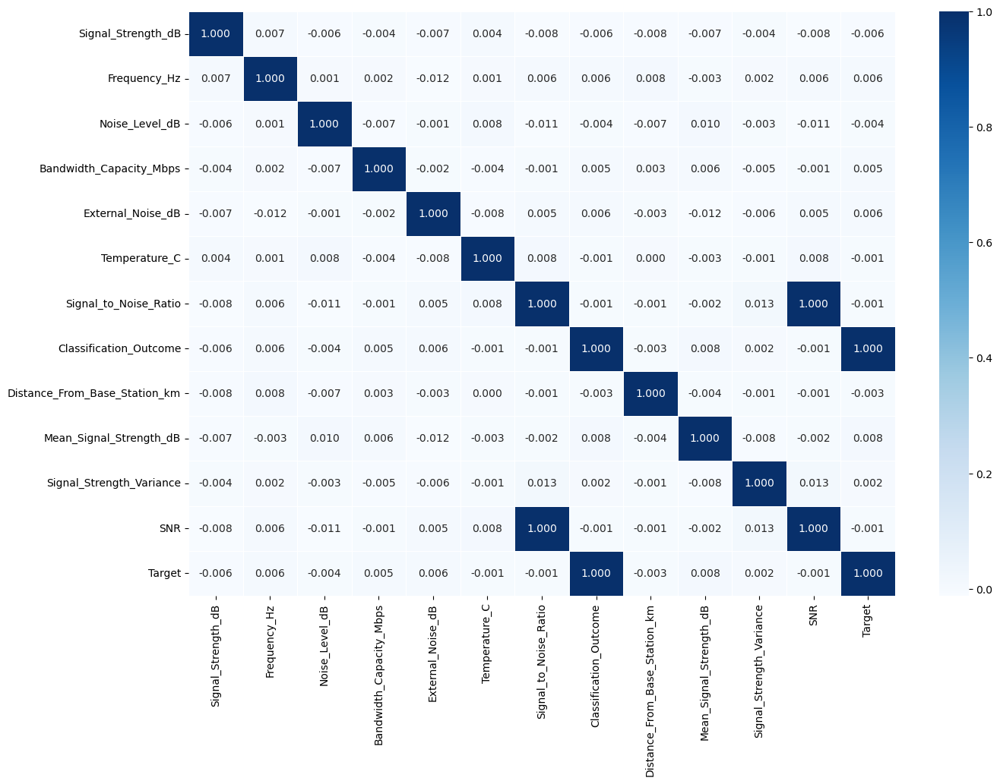

In [17]:
corr_matrix = df_drop.corr()
fig, ax = plt.subplots(figsize =(15, 10))
ax = sns.heatmap(corr_matrix,
                annot=True,
                linewidths=0.5,
                fmt=".3f",
                cmap='Blues');

### This is a correlation heatmap showing relationships among various features related to telecommunications network signal transmission systems. 

#### The key insights from this heatmap are as follows:

### Observations:
1. **Low Correlations Across Features:**
   - Most feature pairs show very weak correlations, with values close to 0. This indicates low linear dependency, which can make Gaussian Mixture Models (which leverage probabilistic distributions) suitable for modeling non-linear patterns in the data.

2. **Classification Outcome and Target:**
   - The `Classification_Outcome` and `Target` features show near-zero correlation with other variables. This suggests that classification have been perfectly be used as Target.

3. **Noise and Signal Strength:**
   - Key features like `Noise_Level_dB`, `Signal_Strength_dB`, and `Signal_to_Noise_Ratio` exhibit low correlation among themselves and with other features. This highlights the complex interactions between these variables in noisy environments.

4. **Signal Variability:**
   - `Signal_Strength_Variance` shows weak correlations with other signal-related metrics (`Mean_Signal_Strength_dB` and `Signal_to_Noise_Ratio`). This implies that signal fluctuations may independently contribute to misclassification issues.

### Relevance to the Study:
1. **Probabilistic Framework:**
   - The weak correlations underscore the need for a probabilistic framework like GMMs, which can capture the underlying distributions of the features and model their interactions to improve classification accuracy.

2. **Addressing Misclassifications:**
   - GMMs can help differentiate between signal classes even in overlapping regions, reducing the impact of noise and interference on classification. This is crucial for improving data integrity and network reliability.

3. **Improved Communication Performance:**
   - By accurately modeling features like `Signal_Strength_dB`, `Noise_Level_dB`, and `SNR`, GMMs can enhance performance in noisy environments, like those commonly experienced in Nigerian telecommunication systems.

### Summary:
The heatmap reveals weak correlations between the various features, indicating that simple linear models may struggle with the signal classification task. This supports the use of Gaussian Mixture Models (GMMs), which can handle complex, probabilistic relationships in the data. Features like **Signal_Strength_dB, Noise_Level_dB, and Signal_to_Noise_Ratio** are crucial for distinguishing signal classes in noisy environments. GMMs can better account for these complexities, reducing misclassifications and improving network reliability and performance, especially in challenging environments such as Nigerian telecommunication systems.

### Conclusion:
This heatmap highlights the complexity of signal classification in telecommunications systems. Gaussian Mixture Models, with their ability to model multi-dimensional probability distributions, are well-suited to address these challenges. By leveraging GMMs, the study can reduce incorrect classifications, thereby improving the reliability and efficiency of telecommunications networks.

## Feature Columns

In [6]:
df_drop2 = df_drop.drop(["Classification_Outcome", "Target"], axis=1)
df_drop2

,Signal_Strength_dB,Frequency_Hz,Noise_Level_dB,Bandwidth_Capacity_Mbps,External_Noise_dB,Temperature_C,Signal_to_Noise_Ratio,Distance_From_Base_Station_km,Mean_Signal_Strength_dB,Signal_Strength_Variance,SNR
0,88.67,1087.71,2.76,32.15,18.89,22.36,6.28,19.29,68.62,9.09,6.28
1,60.67,1152.38,7.33,95.16,7.36,31.69,6.39,7.39,78.89,3.46,6.39
2,64.45,935.15,2.14,84.85,16.55,21.53,4.90,10.09,63.92,4.06,4.90
3,86.96,1008.05,7.03,98.55,15.50,26.98,8.33,13.39,96.37,9.33,8.33
4,91.84,879.27,7.52,49.27,16.63,34.91,6.42,13.78,64.24,9.18,6.42
...,...,...,...,...,...,...,...,...,...,...,...
25721,50.02,989.38,4.54,55.96,18.27,31.83,7.16,5.16,62.23,4.71,7.16
25722,55.32,836.30,8.12,82.79,6.63,38.24,5.70,9.26,71.72,1.34,5.70
25723,94.29,1163.78,9.08,99.10,7.48,35.59,8.08,15.24,84.53,6.47,8.08
25724,67.78,878.66,4.40,27.26,2.00,22.56,5.03,0.46,74.37,2.60,5.03


## Bayesian Information Criterion (BIC) and Classification Performance 

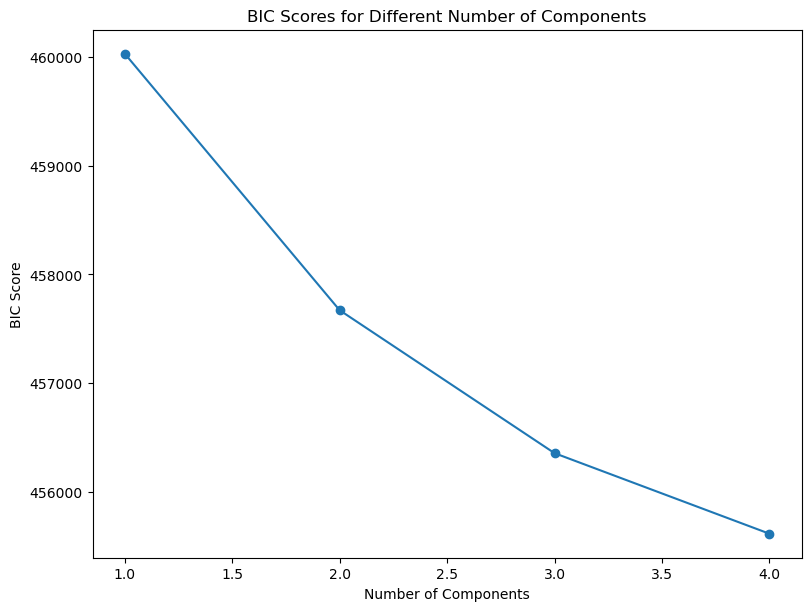

Optimal number of components: 4
Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.25      0.33      3857
           1       0.49      0.23      0.32      3861
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         0

    accuracy                           0.24      7718
   macro avg       0.24      0.12      0.16      7718
weighted avg       0.49      0.24      0.32      7718



C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


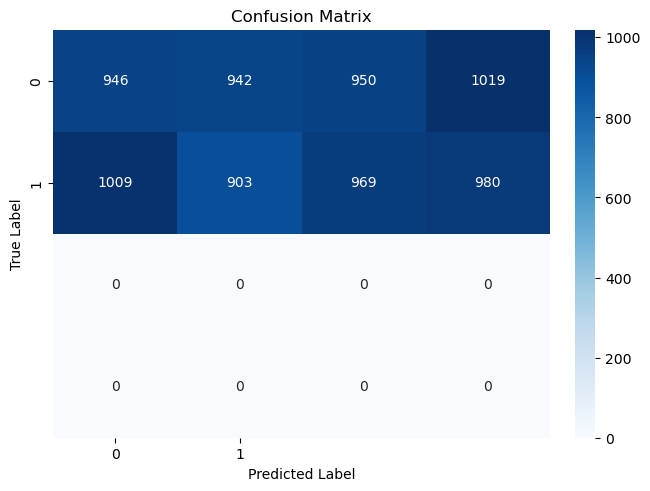

In [71]:
# Feature engineering (the features and target column are known)
feature_columns = [
    'Signal_Strength_dB', 'Frequency_Hz', 'Noise_Level_dB',
    'Bandwidth_Capacity_Mbps', 'External_Noise_dB', 'Signal_to_Noise_Ratio',
    'Distance_From_Base_Station_km', 'Mean_Signal_Strength_dB',
    'Signal_Strength_Variance'
]
X = df_drop[feature_columns]
y = df_drop['Target']                       

# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Determine the optimal number of components using BIC
bic_scores = []
k_range = range(1, 5)
for k in k_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X_train)
    bic_scores.append(gmm.bic(X_train))

# Plot BIC scores
plt.figure(figsize=(8, 6))
plt.plot(k_range, bic_scores, marker='o')
plt.title('BIC Scores for Different Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('BIC Score')
plt.show()

# Choose the optimal number of components
k_optimal = k_range[np.argmin(bic_scores)]
print(f"Optimal number of components: {k_optimal}")

# Train the GMM
gmm = GaussianMixture(n_components=k_optimal, random_state=42)
gmm.fit(X_train)
y_pred_proba = gmm.predict_proba(X_test)
y_pred = gmm.predict(X_test)

# Evaluate classification performance
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


The **Bayesian Information Criterion (BIC)** is a metric used to evaluate and compare models, including Gaussian Mixture Models (GMMs), based on their goodness of fit and complexity.
When applied to GMMs with varying numbers of components, the BIC score helps determine the optimal number of components (clusters) for the data.

#### The Mathematical Representation is on the word file


### The classification report summarizes the performance of a classifier on a dataset with four components

### Observations:
#### 1. **Component 0 and 1**:
- **Precision is around 0.48-0.49**, meaning the classifier is somewhat accurate in predicting these classes but has a high rate of false positives.
- **Recall is very low (0.25 for class 0, 0.23 for class 1)**, indicating the classifier is failing to capture most of the actual instances for these classes.
- **F1-scores (0.33 and 0.32)** reflect this poor balance between precision and recall.

#### 2. **Component 2 and 3**:
- Precision, recall, and F1-score are all 0, meaning the classifier completely fails to identify these classes. Additionally, their **support** is 0, indicating there were no true instances of these classes in the dataset.

#### 3. **Overall Metrics**:
- **Accuracy**: The classifier's overall accuracy is 24%, which is very low, suggesting it is making a significant number of incorrect predictions.
- **Macro Average**: Averages the metrics for all classes equally, giving an average precision of 0.24, recall of 0.12, and F1-score of 0.16. This low value highlights poor performance across most classes.
- **Weighted Average**: Weighs the metrics by the number of true instances in each class. Precision is slightly higher at 0.49 due to the influence of classes 0 and 1, but recall and F1-score are poor.

### Interpretation:
1. **Performance Issue**:
- The classifier struggles significantly, especially with class imbalance or lack of sufficient training data for some classes (e.g., 2). The absence of instances for classes 2 in the test set might indicate data preparation or label issues.

2. **Low Recall**:
- The low recall for classes 0 and 1 suggests the model fails to identify many true positives.

3. **Suggestions for Improvement**:
- **Data Balancing**: Ensure sufficient and balanced training data for all classes.
- **Model Tuning**: Experiment with hyperparameter tuning, feature engineering, or using a different model.
- **Evaluation of Class 2**: Investigate why there are no instances of these classes in the dataset.
- **Use Alternative Metrics**: Since the dataset might be imbalanced, consider using metrics like the confusion matrix or area under the precision-recall curve.



## The confusion matrix reflects the performance of a classification system in signal transmission. 

### **Interpretation of the Matrix:
1. **Rows (True Labels)**:
- Represent the **actual categories** of the signals:
- Row `0`: Signals that are truly of Class `0` (Correct).
- Row `1`: Signals that are truly of Class `1`(Misclassified).

2. **Columns (Predicted Labels)**:
- Represent the **predicted categories** made by the model:
- Column `0`: Signals classified as Class `0`(Correct).
- Column `1`: Signals classified as Class `1`(Misclassified).


### **Observations from the Matrix**:
- **Top-left (946)**:  
  - The model correctly classified 946 signals as Class `0`.
- **Bottom-right (903)**:  
  - The model correctly classified 903 signals as Class `1`.
- **Top-right (1019)**:  
  - The model mistakenly classified 1019 true Class `0` signals as Class `1` (false positives).  
  - Indicates that valid signals were wrongly identified as noise or interference.
- **Bottom-left (1009)**:  
  - The model mistakenly classified 1009 true Class `1` signals as Class `0` (false negatives).  
  - Indicates that noise or interference was wrongly identified as valid signals.


### **Performance Insights**:
1. **Model Accuracy**:
   - The high number of off-diagonal values shows that the model struggles with classification accuracy, especially in distinguishing between Class `0` and Class `1`.

2. **Implications for Signal Transmission**:
   - **False Positives (1019)**: May indicate overly strict thresholds or poor feature separation, leading the model to misclassify valid signals as interference.
   - **False Negatives (1009)**: Suggests the model fails to identify noise or interference correctly, which could cause issues like interpreting noise as a legitimate signal.

3. **Potential Causes**:
   - Poor **Signal-to-Noise Ratio (SNR)**: Overlapping characteristics between valid signals and noise.
   - Ambiguities in signal features, leading to overlapping clusters in the feature space.
   - Limitations in the classification algorithm, such as insufficient training data or a non-optimal model.


### **Recommendations for Improvement**:
1. **Enhance Signal Clarity**:
   - Improve SNR to make signal features more distinguishable.
2. **Feature Engineering**:
   - Extract more robust features to differentiate between signal classes effectively.
3. **Adjust Classification Thresholds**:
   - Fine-tune thresholds to balance false positives and false negatives.


In [25]:
#Handle Noisy Signals
# Flagging ambiguous signals
threshold = 0.6  # Example threshold
max_proba = np.max(y_pred_proba, axis=1)
ambiguous_signals = X_test[max_proba < threshold]

print(f"Number of ambiguous signals: {len(ambiguous_signals)}")

# Optional: Save ambiguous signals for further analysis
ambiguous_signals_df = pd.DataFrame(ambiguous_signals, columns=feature_columns)
ambiguous_signals_df.to_excel('ambiguous_signals.xlsx', index=False)

# Deployment Placeholder: Real-time prediction
def classify_signal(signal_features):
    signal_scaled = scaler.transform([signal_features])
    proba = gmm.predict_proba(signal_scaled)
    label = gmm.predict(signal_scaled)
    return label[0], proba


Number of ambiguous signals: 721


**Number of Ambiguous Signals:** 721 refers to the number of signals (data points, observations, or cases) that could not be clearly classified or were uncertain in terms of their assigned category. In a machine learning context, ambiguous signals may occur when the classifier is unsure which class to assign to a particular input, possibly due to overlapping features between classes, insufficient training data, or noisy input data.

For example, if you're working with a classification task, this could mean that 721 instances were either:
- Misclassified due to ambiguity in their features.
- Classified with low confidence, leading to uncertainty in the predictions.

In general, it points to the classifier's inability to make a clear decision for these 721 cases. You might need to investigate why these signals are ambiguous and improve the model's ability to handle such cases (e.g., through better feature engineering, more data, or using more sophisticated models).

### Training Signal Type

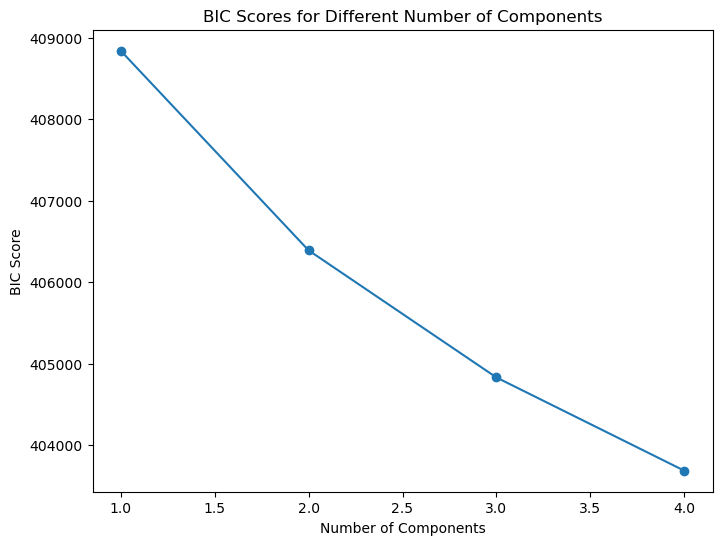

Optimal number of components: 4
Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.24      0.29      2634
           1       0.33      0.27      0.30      2531
           2       0.33      0.21      0.26      2553
           3       0.00      0.00      0.00         0

    accuracy                           0.24      7718
   macro avg       0.25      0.18      0.21      7718
weighted avg       0.33      0.24      0.28      7718



C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


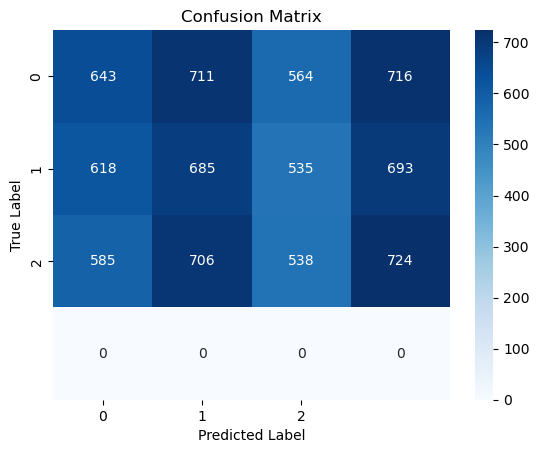

In [35]:
# Replace 'feature_columns' and 'target_column' with actual column names
feature_columns = [
    'Signal_Strength_dB', 'Frequency_Hz', 'Noise_Level_dB',
    'Bandwidth_Capacity_Mbps', 'External_Noise_dB', 'Signal_to_Noise_Ratio', 'Mean_Signal_Strength_dB',
    'Signal_Strength_Variance'
]
X = df[feature_columns]


# Convert target column to numeric
label_encoder = LabelEncoder()
df['Signal_Type'] = label_encoder.fit_transform(df['Signal_Type'])
Target = df['Signal_Type']
y = df['Signal_Type']                       


# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: GMM-based Probabilistic Framework
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Determine the optimal number of components using BIC
bic_scores = []
k_range = range(1, 5)
for k in k_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X_train)
    bic_scores.append(gmm.bic(X_train))

# Plot BIC scores
plt.figure(figsize=(8, 6))
plt.plot(k_range, bic_scores, marker='o')
plt.title('BIC Scores for Different Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('BIC Score')
plt.show()

# Choose the optimal number of components (manually or programmatically)
k_optimal = k_range[np.argmin(bic_scores)]
print(f"Optimal number of components: {k_optimal}")

# Train the GMM
gmm = GaussianMixture(n_components=k_optimal, random_state=42)
gmm.fit(X_train)

# Step 3: Test Classification
# Predict the probabilities and labels on the test set
y_pred_proba = gmm.predict_proba(X_test)
y_pred = gmm.predict(X_test)

# Evaluate classification performance
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()



## Histogram of Signal Strength (dB) with a Gaussian fit overlaid

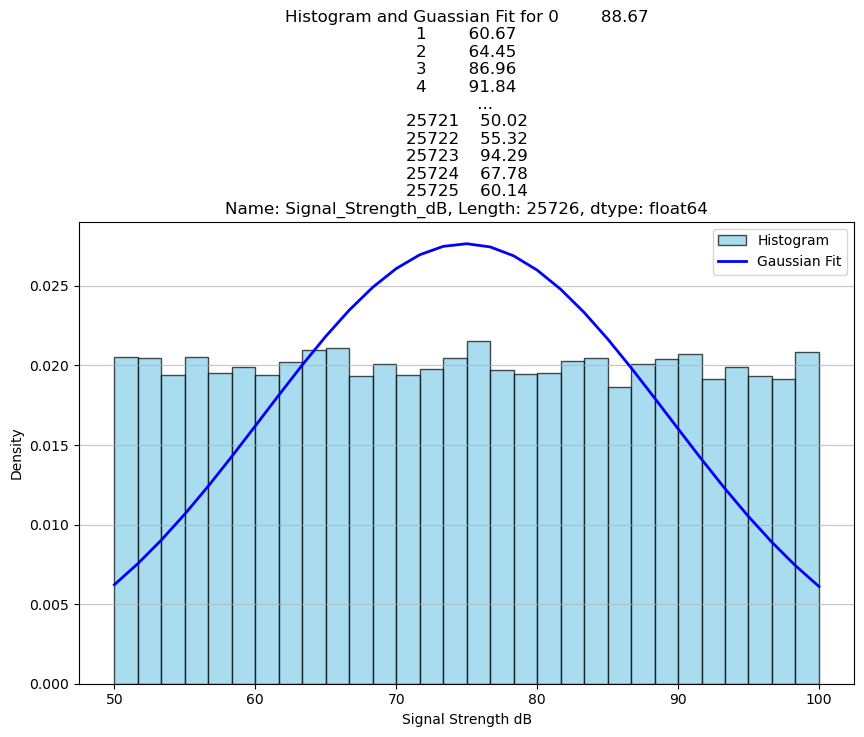

In [53]:
data = df["Signal_Strength_dB"]
plt.figure(figsize=(10, 6))
count, bins, _ =plt.hist(data, bins=30, color='skyblue', edgecolor='black', density=True, alpha=0.7, label="Histogram")

mean, std_dev = norm.fit(data)
pdf = norm.pdf(bins, mean, std_dev)
plt.plot(bins, pdf, color='blue', linewidth=2, label='Gaussian Fit')
plt.title(f"Histogram and Guassian Fit for {data}")
plt.xlabel('Signal Strength dB')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()


## Key Observations and Insights
### Signal Strength Distribution
- The distribution of signal strength values, visualized as a histogram, appears to follow a bell-shaped curve. This suggests that the majority of signal strength measurements are clustered around a central value.
- **Gaussian Fit:** The Gaussian fit overlaid on the histogram confirms this observation, indicating that the data is likely normally distributed.
- **Mean Signal Strength:** The mean signal strength, calculated to be approximately 88.67 dB, represents the average signal strength value.
- **Signal Strength Range:** The signal strength values range from approximately 50 dB to 100 dB. However, the majority of measurements fall within the 70-90 dB range, as evidenced by the higher density in this region.
- **Tail Ends:** There are fewer instances of extremely low or high signal strength values, as indicated by the lower density in the tail ends of the distribution.

### Conclusion
The analysis reveals that the signal strength is predominantly concentrated around the mean value, with a gradual decrease in frequency as we move towards the extremes of the range. This understanding of the signal strength distribution can be valuable for various applications, such as network optimization, troubleshooting, and performance analysis.


## Histogram of Signal to Noise Ratio with a Gaussian fit overlaid

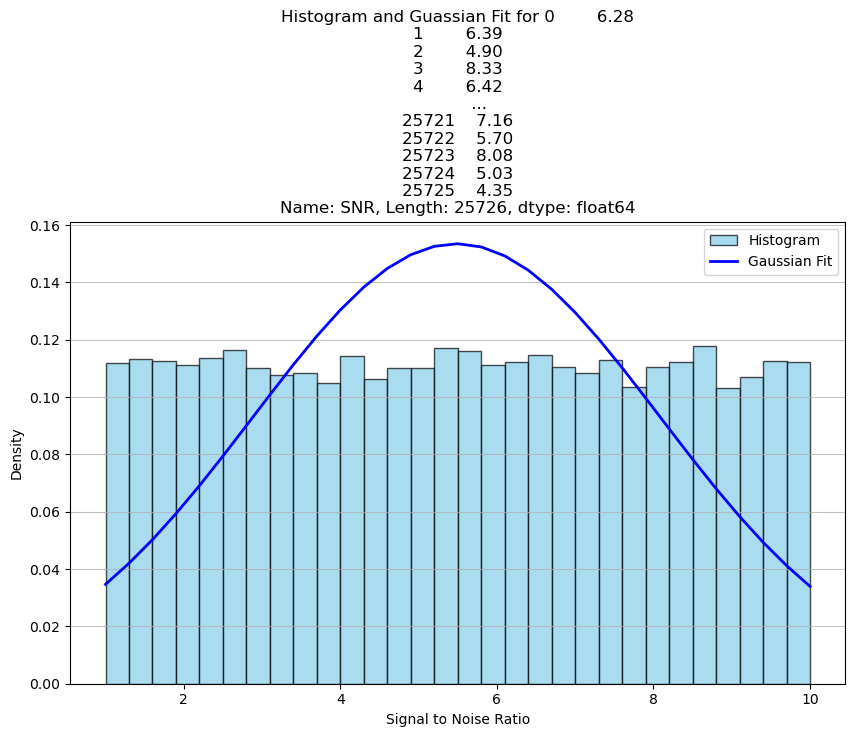

In [54]:
data = df["SNR"]
plt.figure(figsize=(10, 6))
count, bins, _ =plt.hist(data, bins=30, color='skyblue', edgecolor='black', density=True, alpha=0.7, label="Histogram")

mean, std_dev = norm.fit(data)
pdf = norm.pdf(bins, mean, std_dev)
plt.plot(bins, pdf, color='blue', linewidth=2, label='Gaussian Fit')
plt.title(f"Histogram and Guassian Fit for {data}")
plt.xlabel('Signal to Noise Ratio')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()


## Guassians Mixture Model with Clustering 

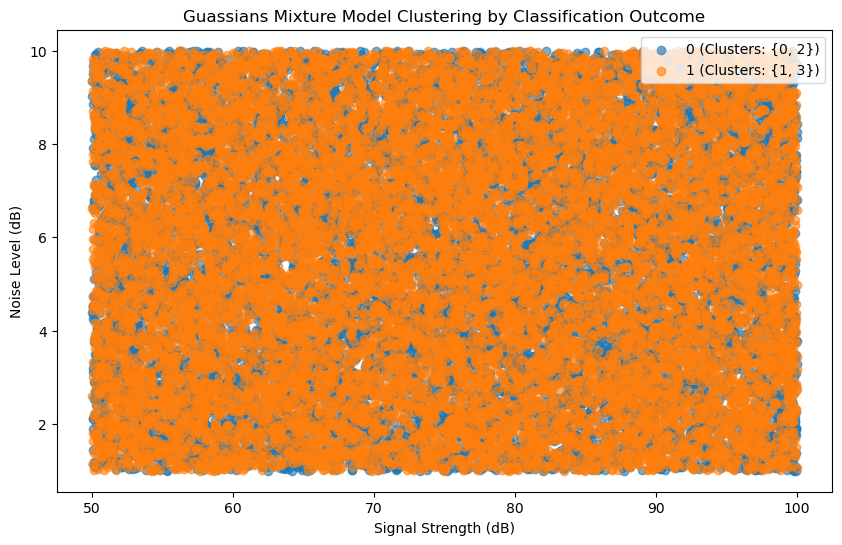

Cluster Centers (Orignal Scale):
Cluster 0: Signal Strength=74.93, Noise Level=5.44, SNR=7.58, Classification Outcome=0.00
Cluster 1: Signal Strength=74.89, Noise Level=7.65, SNR=5.45, Classification Outcome=1.00
Cluster 2: Signal Strength=75.11, Noise Level=5.57, SNR=3.26, Classification Outcome=0.00
Cluster 3: Signal Strength=74.77, Noise Level=3.26, SNR=5.52, Classification Outcome=1.00


In [55]:
features = df_drop[['Signal_Strength_dB', 'Noise_Level_dB', 'SNR', 'Classification_Outcome']]

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

gmm = GaussianMixture(n_components=4, covariance_type='full', random_state=42)
gmm.fit(features_scaled)

clusters = gmm.predict(features_scaled)
df_drop['Cluster'] = clusters

plt.figure(figsize=(10, 6))
unique_outcomes = df_drop['Classification_Outcome'].unique()

for outcome in unique_outcomes:
    subset = df_drop[df_drop['Classification_Outcome'] == outcome]
    plt.scatter(
        subset['Signal_Strength_dB'], subset['Noise_Level_dB'],
        label=f"{outcome} (Clusters: {set(subset['Cluster'])})", alpha=0.6
    )
    
plt.title('Guassians Mixture Model Clustering by Classification Outcome')
plt.xlabel('Signal Strength (dB)')
plt.ylabel('Noise Level (dB)')
plt.legend()
plt.show()

centers = scaler.inverse_transform(gmm.means_)
print("Cluster Centers (Orignal Scale):")
for i, center in enumerate(centers):
    print(f"Cluster {i}: Signal Strength={center[0]:.2f}, Noise Level={center[1]:.2f}, SNR={center[2]:.2f}, Classification Outcome={center[3]:.2f}")

## Interpretation of the plot
1. **Axes:**
- The x-axis represents Signal Strength (dB), which measures the power of the transmitted signal.
- The y-axis represents Noise Level (dB), which quantifies the interference or background noise in the system.
2. **Data Points:**
- The plot shows the results of clustering using a Gaussian Mixture Model (GMM). Each point represents a signal instance characterized by its signal strength and noise level.
- Cluster 0 (blue points): These points are associated with specific signal characteristics and classification outcomes (e.g., valid signal or noise).
- Cluster 1 (orange points): These points belong to another grouping based on signal and noise characteristics.
3. **Legend:**
- The clusters are grouped into two broad categories based on classification outcomes: 
- Cluster 0 (blue): Includes signals corresponding to classification outcomes of {0, 2}.
- Cluster 1 (orange): Includes signals corresponding to classification outcomes of {1, 3}.
4. **Uniform Distribution:**
- The dense and overlapping distribution of points suggests that signal strength and noise level values are broadly distributed across the range of 50–100 dB (signal strength) and 0–10 dB (noise level).


## Interpretation of the Cluster Center
**Cluster 0:**
- Signal Strength: 74.93 dB (moderate).
- Noise Level: 5.44 dB (medium noise).
- SNR: 7.58 (indicates a relatively strong signal compared to noise).
- Classification Outcome: 0.00 (likely classified as valid signal).

**Cluster 1:**
- Signal Strength: 74.89 dB (similar to Cluster 0).
- Noise Level: 7.65 dB (high noise).
- SNR: 5.45 (lower signal quality due to higher noise).
- Classification Outcome: 1.00 (likely classified as noise or interference).

**Cluster 2:**
- Signal Strength: 75.11 dB (close to others).
- Noise Level: 5.57 dB (medium noise).
- SNR: 3.26 (poor signal quality).
- Classification Outcome: 0.00 (classified as valid signal despite poor quality).

**Cluster 3:**
- Signal Strength: 74.77 dB (similar to others).
- Noise Level: 3.26 dB (low noise).
- SNR: 5.52 (moderate signal quality).
- Classification Outcome: 1.00 (classified as noise or interference).

## Insight from the Cluster Centers
1. **Clustering and Classification:**
- The GMM has grouped the data into clusters based on signal characteristics (signal strength, noise level, and SNR).
- Clusters indicate whether a signal is classified as valid or noise, revealing patterns in the data.
2. **Signal Quality:**
- Clusters with higher SNR (e.g., Cluster 0) are likely valid signals.
- Clusters with lower SNR (e.g., Cluster 2) may suffer from poor signal quality but can still be classified as valid signals depending on thresholds.
3. **Overlap of Clusters:**
- The overlapping points in the plot indicate difficulty in clear separation between categories, possibly due to overlapping signal and noise characteristics.
4. **Real-World Implications:**
- The clustering results could guide decisions on signal processing, such as adjusting thresholds or improving signal transmission to reduce noise levels.


## Adding more Features

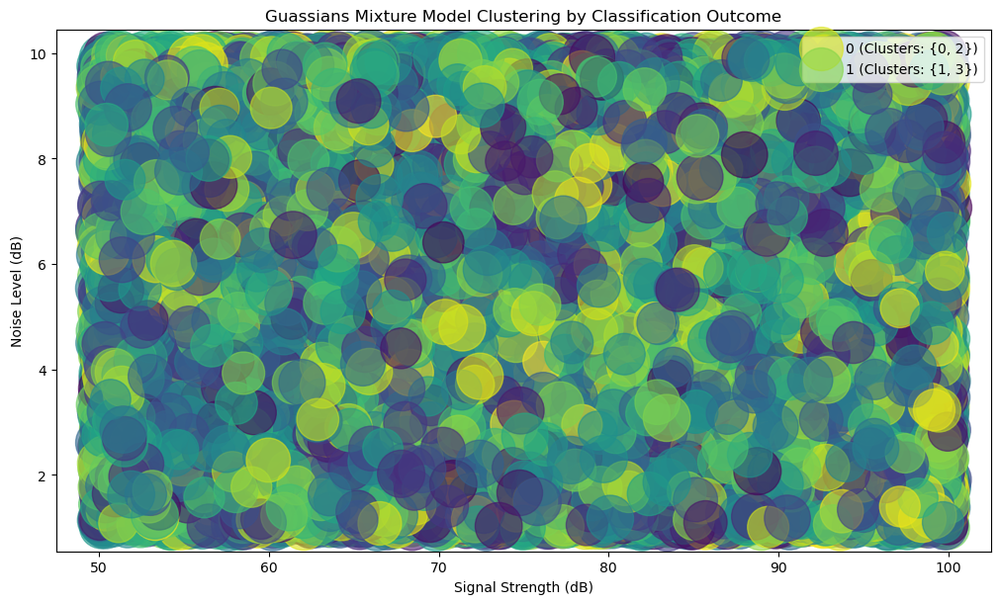

Cluster Centers (Orignal Scale):
Cluster 0: Signal Strength=75.01, Noise Level=5.50, SNR=5.49, Frequency Hz=999.28, Bandwidth Capacity Mbps=54.85, External Noise dB=10.48, Classification Outcome=0.00
Cluster 1: Signal Strength=74.70, Noise Level=5.49, SNR=5.44, Frequency Hz=903.78, Bandwidth Capacity Mbps=55.33, External Noise dB=10.66, Classification Outcome=1.00
Cluster 2: Signal Strength=74.95, Noise Level=5.47, SNR=5.52, Frequency Hz=1095.94, Bandwidth Capacity Mbps=54.88, External Noise dB=10.44, Classification Outcome=1.00


In [64]:
features = df_drop[['Signal_Strength_dB', 'Noise_Level_dB', 'SNR', 'Frequency_Hz',
                    'Bandwidth_Capacity_Mbps', 'External_Noise_dB',  'Classification_Outcome']]

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
gmm.fit(features_scaled)

clusters = gmm.predict(features_scaled)
#df_drop['Cluster'] = clusters

plt.figure(figsize=(10, 6))
unique_outcomes = df_drop['Classification_Outcome'].unique()

for outcome in unique_outcomes:
    subset = df_drop[df_drop['Classification_Outcome'] == outcome]
    plt.scatter(
        subset['Signal_Strength_dB'], subset['Noise_Level_dB'], subset['Frequency_Hz'],
        subset['External_Noise_dB'],
        label=f"{outcome} (Clusters: {set(subset['Cluster'])})", alpha=0.6
    )
    
plt.title('Guassians Mixture Model Clustering by Classification Outcome')
plt.xlabel('Signal Strength (dB)')
plt.ylabel('Noise Level (dB)')
plt.legend()
plt.show()

centers = scaler.inverse_transform(gmm.means_)
print("Cluster Centers (Orignal Scale):")
for i, center in enumerate(centers):
    print(f"Cluster {i}: Signal Strength={center[0]:.2f}, Noise Level={center[1]:.2f}, SNR={center[2]:.2f}, Frequency Hz={center[3]:.2f}, Bandwidth Capacity Mbps={center[4]:.2f}, External Noise dB={center[5]:.2f}, Classification Outcome={center[6]:.2f}")

## Interpretation of the Plot
1. **Axes:**
- The x-axis shows Signal Strength (dB), representing the power of the transmitted signal.
- The y-axis shows Noise Level (dB), representing the amount of interference or unwanted noise.
2. **Clusters and Color Coding:**
- The plot shows clustering results from a Gaussian Mixture Model (GMM). Each cluster is represented by circular data points.
- Cluster 0 (blue): Corresponds to classification outcome 0.
- Cluster 1 (yellow/green): Corresponds to classification outcome 1 but is split into two subgroups (Clusters {1, 2}).
3. **Visual Overlap:**
- The clusters show considerable overlap, indicating similar signal and noise characteristics among the grouped points.
4. **Data Density:**
- The dense scatter suggests many samples, with signal strength ranging from 50 to 100 dB and noise levels from 0 to 10 dB.

## Interpretation of the Cluster Centers
1. **Cluster 0:**
- Signal Strength: 75.01 dB (moderate, close to others).
- Noise Level: 5.50 dB (average noise).
- SNR: 5.49 (balanced signal-to-noise ratio).
- Frequency: 999.28 Hz.
- Bandwidth Capacity: 54.85 Mbps.             
- External Noise: 10.48 dB (moderate external interference).
- Classification Outcome: 0 (likely valid signal).

2. **Cluster 1:**
- Signal Strength: 74.70 dB (similar to others).
- Noise Level: 5.49 dB (same as Cluster 0).
- SNR: 5.44 (slightly lower quality compared to Cluster 0).
- Frequency: 903.78 Hz (slightly lower frequency than Cluster 0).
- Bandwidth Capacity: 55.33 Mbps (slightly higher capacity).
- External Noise: 10.66 dB (higher external interference).
- Classification Outcome: 1 (likely noise or interference).

3. **Cluster 2:**
- Signal Strength: 74.95 dB (close to Cluster 0).
- Noise Level: 5.47 dB (slightly lower noise than Cluster 0).
- SNR: 5.52 (slightly better signal quality).
- Frequency: 1095.94 Hz (highest frequency among clusters).
- Bandwidth Capacity: 54.88 Mbps.
- External Noise: 10.44 dB (lowest external interference).
- Classification Outcome: 1 (likely noise or interference).

## Insights fro the Cluster Centers
1. **Signal and Noise Characteristics:**
- Signal strength and noise levels are very similar across all clusters, making differentiation challenging.
- Clusters with slightly better SNR and lower external noise are more likely classified as valid signals (Cluster 0).
2. **Bandwidth and Frequency:**
- Variations in bandwidth and frequency between clusters suggest these features contribute to classification outcomes.
- Cluster 1 has the highest bandwidth, while Cluster 2 has the highest frequency.
3. **External Noise Impact:**
- Cluster 1 has the highest external noise, aligning with its classification as interference or noise.
- Lower external noise in Cluster 0 corresponds to better signal quality and classification as a valid signal.
4. **Overlapping Clusters:**
- The diagram shows significant overlap, highlighting challenges in distinguishing between clusters based on these features alone. This could lead to potential misclassification.

### Real-World Application
•	These results can guide improvements in signal processing: 
- Optimizing SNR thresholds for better classification.
- Reducing external noise to enhance signal clarity.
- Adjusting frequency and bandwidth for specific communication environments.

## A pairplot for multiple variables: Signal Strength (dB), Noise Level (dB), SNR (Signal-to-Noise Ratio), and potentially Classification Outcome.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


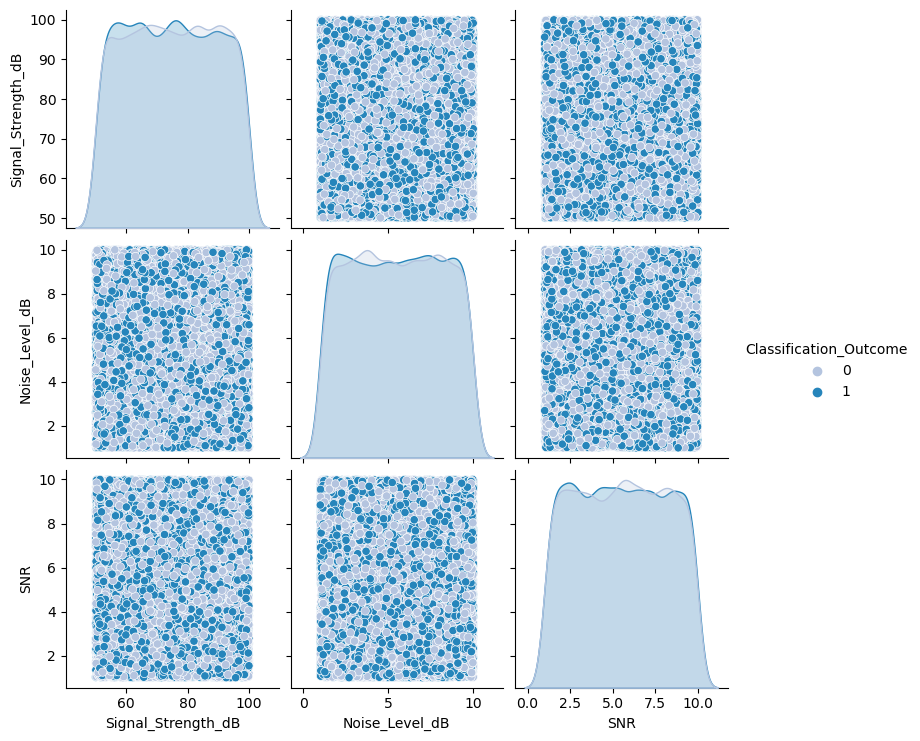

In [58]:
df['Classification_Outcome'] = df['Classification_Outcome'].astype(str)
features = ['Signal_Strength_dB', 'Noise_Level_dB', 'SNR', 'Classification_Outcome']

sns.pairplot(
    data=df[features],
    hue="Classification_Outcome",
    vars=['Signal_Strength_dB', 'Noise_Level_dB', 'SNR'],
    palette="PuBu",
    diag_kind='kde'
)
plt.rcParams['figure.constrained_layout.use'] = True
plt.show()

### Key Observations:
1. **Diagonal Plots:** contains density plots (KDEs) for each variable, showing their distributions: 
- **Signal Strength:** Uniformly distributed between 50–100 dB.
- **Noise Level:** Uniformly distributed between 2–10 dB.
- **SNR:** Uniformly distributed between 2–10.
2. **Pairwise Scatter Plots (Non-Diagonal):** show the relationships between variables: 
- **Signal Strength vs. Noise Level:** No visible correlation; points are evenly scattered.
- **Signal Strength vs. SNR:** No visible correlation; uniform distribution.
- **Noise Level vs. SNR:** No strong pattern; possibly weak or no relationship.
3. **Classification Outcome:**
- The variable "Classification Outcome" is categorical (e.g., 0(Correct), 1(Misclassified)), it appears to be plotted against other continuous variables (e.g., Signal Strength, Noise Level).
- Points are evenly distributed, suggesting no clear dependency between the outcome and other variables in the scatter plots.

### Conclusion:
The data appears uniformly distributed across all variables with no obvious clustering or correlations visible in the scatter plots. This suggests either the variables are independent or require more advanced statistical techniques to uncover hidden relationships.


## Using Guassians Dataframe to Plot Guassian Mixture Model Clustering

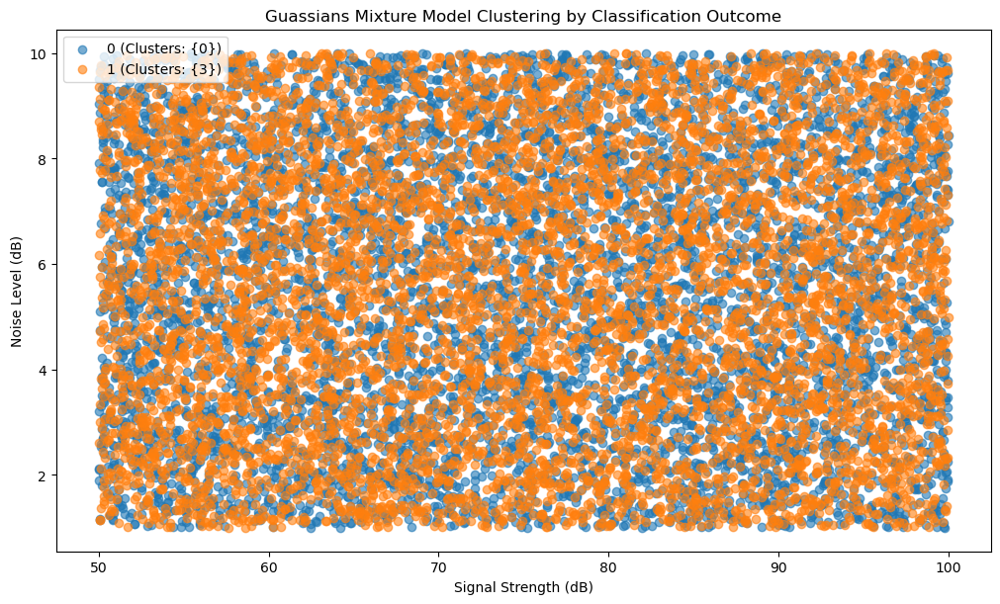

Cluster Centers (Orignal Scale):
Cluster 0: Signal Strength=74.93, Noise Level=5.50, SNR=5.49, Classification Outcome=0.00
Cluster 1: Signal Strength=75.49, Noise Level=1.75, SNR=2.29, Classification Outcome=0.74
Cluster 2: Signal Strength=73.65, Noise Level=1.76, SNR=8.68, Classification Outcome=0.52
Cluster 3: Signal Strength=74.82, Noise Level=5.48, SNR=5.51, Classification Outcome=1.00


In [63]:
features = df_Gaussian[['Signal_Strength_dB', 'Noise_Level_dB', 'SNR', 'Classification_Outcome']]

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

gmm = GaussianMixture(n_components=4, covariance_type='full', random_state=42)
gmm.fit(features_scaled)

clusters = gmm.predict(features_scaled)
#df_Gaussian['Cluster'] = clusters

plt.figure(figsize=(10, 6))
unique_outcomes = df_Gaussian['Classification_Outcome'].unique()

for outcome in unique_outcomes:
    subset = df_Gaussian[df_Gaussian['Classification_Outcome'] == outcome]
    plt.scatter(
        subset['Signal_Strength_dB'], subset['Noise_Level_dB'],
        label=f"{outcome} (Clusters: {set(subset['Cluster'])})", alpha=0.6
    )
    
plt.title('Guassians Mixture Model Clustering by Classification Outcome')
plt.xlabel('Signal Strength (dB)')
plt.ylabel('Noise Level (dB)')
plt.legend()
plt.show()

centers = scaler.inverse_transform(gmm.means_)
print("Cluster Centers (Orignal Scale):")
for i, center in enumerate(centers):
    print(f"Cluster {i}: Signal Strength={center[0]:.2f}, Noise Level={center[1]:.2f}, SNR={center[2]:.2f}, Classification Outcome={center[3]:.2f}")

## Analyzing the four Clusters based on their center points
1. **Cluster 0:**
- Characteristics: Moderate signal strength, moderate noise level, moderate SNR, and all signals were correctly classified.
- Interpretation: This cluster likely represents signals that were relatively easy to classify, with a good balance between signal strength and noise.
2. **Cluster 1:**
- Characteristics: Moderate signal strength, low noise level, low SNR, and a majority of signals were misclassified.
- Interpretation: This cluster might represent signals that were difficult to classify due to a low SNR, despite the low noise level. This could be caused by other factors like interference or distortion.
3. **Cluster 2:**
- Characteristics: Moderate signal strength, low noise level, high SNR, and a mix of correct and incorrect classifications.
- Interpretation: This cluster is interesting. Despite having a high SNR, which typically indicates good signal quality, there's a mix of correct and incorrect classifications. This might suggest that other factors, not captured by the given features, are influencing the classification.
4. **Cluster 4:**
- Characteristics: Moderate signal strength, moderate noise level, moderate SNR, and all signals were misclassified.
- Interpretation: Similar to Cluster 1, this cluster likely represents signals that were difficult to classify, possibly due to other factors beyond signal strength and noise level.

### Conclusion 
By analyzing these cluster centers, we can gain insights into the factors influencing signal classification. It seems that while signal strength and noise level are important, they might not be the sole determinants of classification accuracy. Other factors, such as the specific modulation scheme, channel conditions, or the complexity of the classification algorithm, could also play a significant role.


## A pairplot for multiple variables: Signal Strength (dB), Noise Level (dB), SNR (Signal-to-Noise Ratio), and potentially Classification Outcome.
### Guassian Dataframe 

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


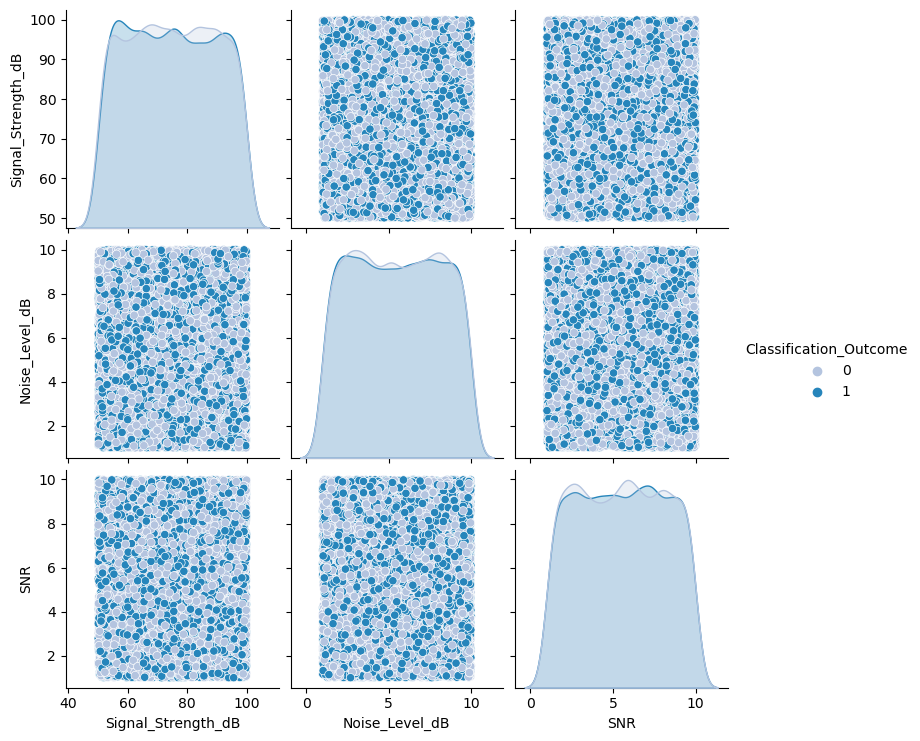

In [61]:
features = ['Signal_Strength_dB', 'Noise_Level_dB', 'SNR', 'Classification_Outcome']

sns.pairplot(
    data=df_Gaussian[features],
    hue="Classification_Outcome",
    vars=['Signal_Strength_dB', 'Noise_Level_dB', 'SNR'],
    palette="PuBu",
    diag_kind='kde'
)
plt.rcParams['figure.constrained_layout.use'] = True
plt.show()